In [1]:
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from IPython.display import display, Image
import os

# Font "stile LaTeX" (Computer Modern) su tutti i plot del notebook.
# Uso mathtext (interno a matplotlib) invece di text.usetex=True: sul cluster manca
# dvipng (solo TinyTeX senza quel pacchetto), quindi usetex romperebbe la generazione.
plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'

def show(fig, name):
    path = f'/tmp/{name}'
    fig.savefig(path, bbox_inches='tight', dpi=150)
    plt.close(fig)
    display(Image(path))

CSV_PATH  = '/users/framunno/data/ionosphere/l1_to_map_matched_2015_march_10_20_deduplicated.csv'
MAPS_DIR  = '/users/framunno/data_2015/maps'
ACE_PATH  = '/users/framunno/data/ionosphere/combined_ACE_1min_gsm_2015.csv'

In [2]:
df = pd.read_csv(CSV_PATH)
df['time_map'] = pd.to_datetime(df['time_map'], utc=True)
df = df.sort_values('time_map').reset_index(drop=True)
print(f'Rows: {len(df)}')
print(f'Period: {df["time_map"].iloc[0]} → {df["time_map"].iloc[-1]}')
print(f'Missing files on disk: {sum(not os.path.exists(os.path.join(MAPS_DIR, f)) for f in df["filename"])}')

Rows: 7493
Period: 2015-03-10 00:04:00+00:00 → 2015-03-20 23:56:00+00:00
Missing files on disk: 0


In [3]:
# Load all maps and compute per-frame stats
records = []
for _, row in df.iterrows():
    fpath = os.path.join(MAPS_DIR, row['filename'])
    if not os.path.exists(fpath):
        continue
    img = np.load(fpath, allow_pickle=True)[0].astype(np.float32)
    records.append({
        'time': row['time_map'],
        'mean': float(np.mean(img)),
        'std':  float(np.std(img)),
        'min':  float(np.min(img)),
        'max':  float(np.max(img)),
        'range': float(np.max(img) - np.min(img)),
        'absmax': float(np.max(np.abs(img))),
    })

stats = pd.DataFrame(records).set_index('time').sort_index()
print(f'Frames loaded: {len(stats)}')
stats.head()

Frames loaded: 7493


,mean,std,min,max,range,absmax
time,,,,,,
2015-03-10 00:04:00+00:00,1275.034546,3735.070557,-8317.806641,9673.848633,17991.656250,9673.848633
2015-03-10 00:06:00+00:00,1250.468750,3888.235840,-9102.838867,10008.297852,19111.136719,10008.297852
2015-03-10 00:08:00+00:00,736.568542,3737.236084,-9413.398438,8973.480469,18386.878906,9413.398438
2015-03-10 00:10:00+00:00,-231.584976,3190.304688,-9160.428711,6775.646484,15936.075195,9160.428711
2015-03-10 00:12:00+00:00,-434.067383,2921.844971,-8539.228516,6432.601562,14971.830078,8539.228516


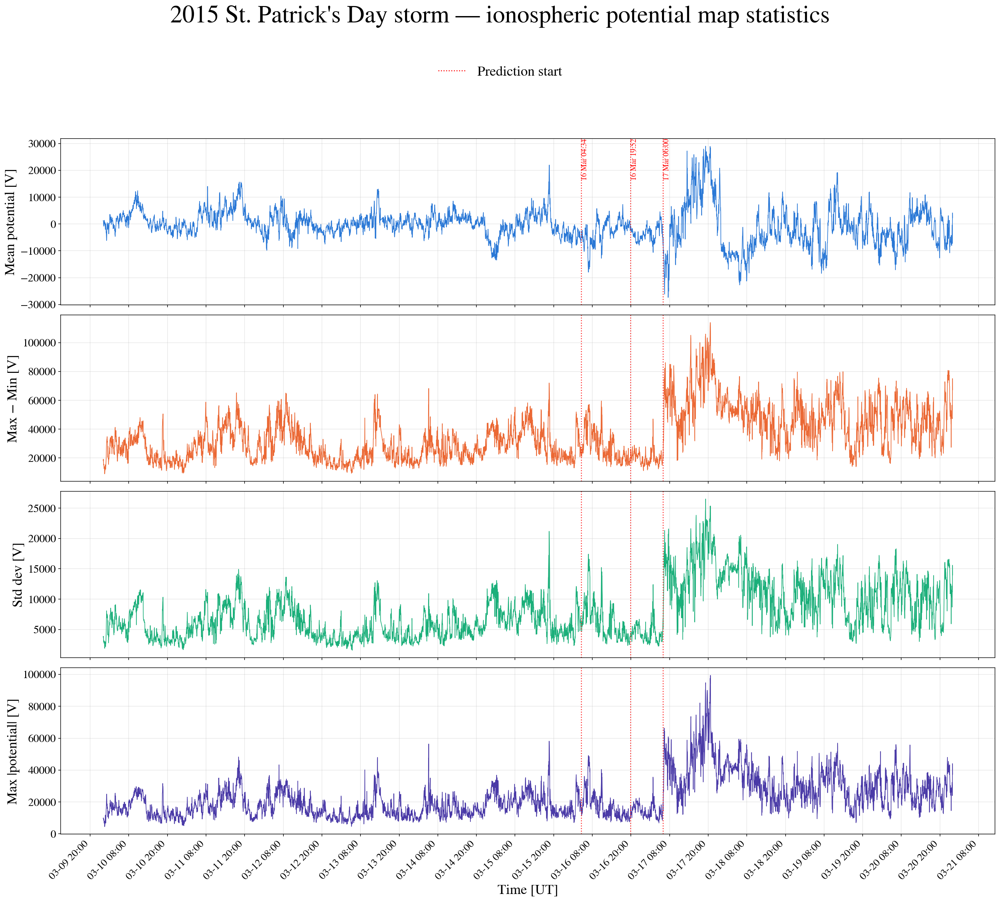

In [5]:
# =============================================================================
# Timestamp di inizio predizione (PRED_START) -- niente piu' fasi della tempesta
# stesso stile delle celle NRMSE/bar chart: colori validati, legenda fuori, font, dpi=300
# =============================================================================
# i veri PRED_START usati in generazione (stessi di PRED_TAGS nelle celle sotto, ridefiniti qui
# per non dipendere dall'ordine di esecuzione delle celle)
pred_starts = {
    tag: pd.Timestamp(tag.replace('T', ' ').replace('h', ':'), tz='UTC')
    for tag in ['2015-03-16T04h34', '2015-03-16T19h52', '2015-03-17T06h00']
}

pairs = [
    ('mean',   'Mean potential [V]',  '#2a78d6'),
    ('range',  'Max \u2212 Min [V]',  '#eb6834'),
    ('std',    'Std dev [V]',         '#1baf7a'),
    ('absmax', 'Max |potential| [V]', '#4a3aa7'),
]

fig, axes = plt.subplots(4, 1, figsize=(20, 16), sharex=True, dpi=300)

for ax, (col, ylabel, color) in zip(axes, pairs):
    ax.plot(stats.index, stats[col], lw=0.9, color=color)
    ax.set_ylabel(ylabel, fontsize=20)
    ax.tick_params(axis='y', labelsize=16)
    ax.grid(alpha=0.3)
    for t in pred_starts.values():
        ax.axvline(t, color='red', lw=1.4, ls=':', alpha=0.8)

# annotazioni testuali solo sul pannello in alto
for tag, t in pred_starts.items():
    axes[0].text(t, axes[0].get_ylim()[1], t.strftime('%d %b %H:%M'), rotation=90, va='top', ha='left',
                 fontsize=11, color='red')

axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
axes[-1].xaxis.set_major_locator(mdates.HourLocator(interval=12))
plt.setp(axes[-1].xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=15)
axes[-1].set_xlabel('Time [UT]', fontsize=20)

from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='red', lw=1.4, ls=':', label='Prediction start'),
]
fig.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.06),
           ncol=1, fontsize=20, frameon=False)
fig.suptitle('2015 St. Patrick\'s Day storm \u2014 ionospheric potential map statistics', fontsize=35, y=1.12)
plt.tight_layout()
show(fig, '2015_timeseries.png')

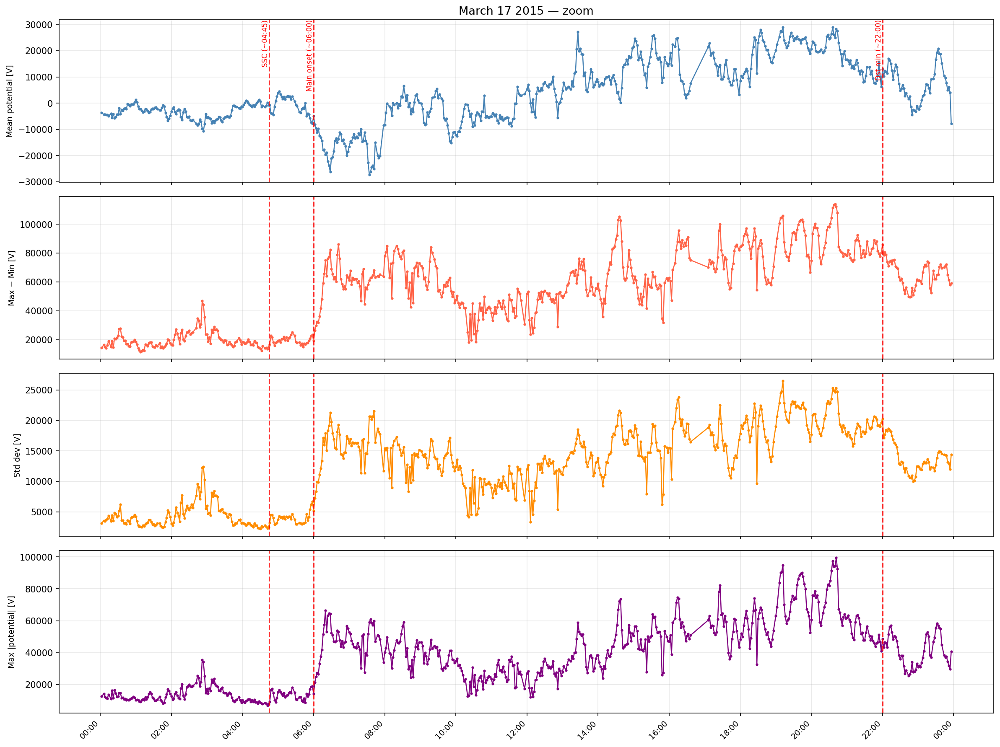

In [5]:
# Zoom on March 17
mask = (stats.index >= '2015-03-17') & (stats.index < '2015-03-18')
s17 = stats[mask]

fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True)

for ax, (col, ylabel, color) in zip(axes, pairs):
    ax.plot(s17.index, s17[col], lw=1.2, color=color, marker='o', ms=2)
    ax.set_ylabel(ylabel, fontsize=9)
    ax.grid(alpha=0.3)
    for label, t in phases.items():
        ax.axvline(t, color='red', lw=1.5, ls='--', alpha=0.8)

for label, t in phases.items():
    axes[0].text(t, axes[0].get_ylim()[1], label, rotation=90,
                 va='top', ha='right', fontsize=8, color='red')

axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
axes[-1].xaxis.set_major_locator(mdates.HourLocator(interval=2))
plt.setp(axes[-1].xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=9)

axes[0].set_title('March 17 2015 — zoom', fontsize=13)
plt.tight_layout()
show(fig, '2015_march17_zoom.png')

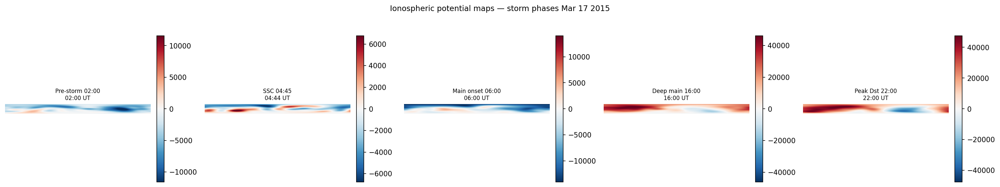

In [6]:
# Sample maps at storm phases
sample_times = [
    ('Pre-storm 02:00', pd.Timestamp('2015-03-17 02:00', tz='UTC')),
    ('SSC 04:45',       pd.Timestamp('2015-03-17 04:45', tz='UTC')),
    ('Main onset 06:00',pd.Timestamp('2015-03-17 06:00', tz='UTC')),
    ('Deep main 16:00', pd.Timestamp('2015-03-17 16:00', tz='UTC')),
    ('Peak Dst 22:00',  pd.Timestamp('2015-03-17 22:00', tz='UTC')),
]

fig, axes = plt.subplots(1, len(sample_times), figsize=(20, 4))

for ax, (label, t) in zip(axes, sample_times):
    diffs = pd.Series([(idx - t).total_seconds() for idx in stats.index])
    nearest_t = stats.index[diffs.abs().argmin()]
    row = df.iloc[[(df['time_map'] - nearest_t).abs().argmin()]]
    fname = row.iloc[0]['filename']
    fpath = os.path.join(MAPS_DIR, fname)
    img = np.load(fpath, allow_pickle=True)[0].astype(np.float32)
    vmax = np.percentile(np.abs(img), 99)
    im = ax.imshow(img, cmap='RdBu_r', vmin=-vmax, vmax=vmax, origin='lower')
    ax.set_title(f'{label}\n{nearest_t.strftime("%H:%M")} UT', fontsize=8)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle('Ionospheric potential maps — storm phases Mar 17 2015', fontsize=11)
plt.tight_layout()
show(fig, '2015_sample_maps.png')

[NOCOND 2015-03-16T04h34] 3 sample, 1911 frame  03-16 04:34 → 03-18 20:14
[NOCOND 2015-03-16T19h52] 3 sample, 1463 frame  03-16 19:52 → 03-18 20:36
[NOCOND 2015-03-17T06h00] 3 sample, 1162 frame  03-17 06:16 → 03-18 20:58


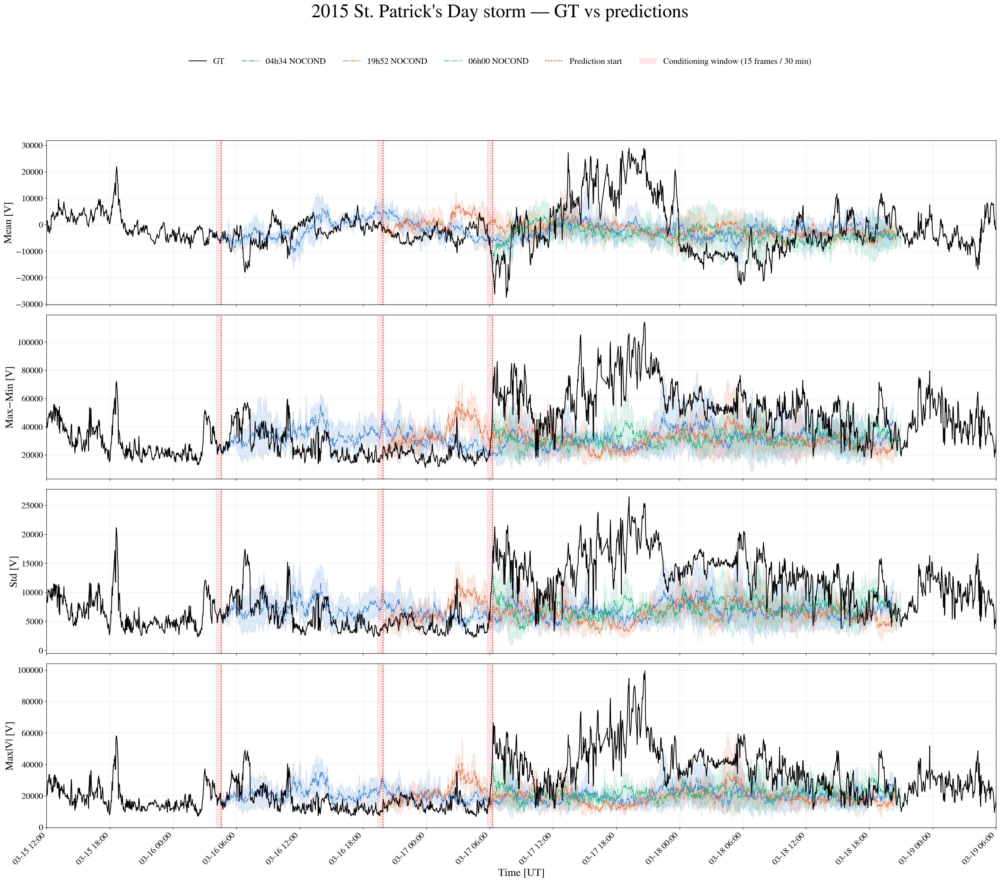

In [12]:
import json

# =============================================================================
# CONFIG
# =============================================================================
BASE = "/capstor/scratch/cscs/framunno"
PRED_TAGS   = ["2015-03-16T04h34", "2015-03-16T19h52", "2015-03-17T06h00"]
TAG_COLORS  = ['#2a78d6', '#eb6834', '#1baf7a']

MODELS = {
    #'CLASSIC': (f"{BASE}/results_2015_CLASSIC_AR50_pred{{tag}}", '-'),
    #'UNET':    (f"{BASE}/results_2015_UNET_AR50_pred{{tag}}",    '--'),
    'NOCOND':  (f"{BASE}/results_2015_NOCOND_AR50_pred{{tag}}",  '-.'),
}

COND_FRAMES = 15
FRAME_DT    = 2
NORM_SCALE  = 80000

pairs = [('mean', 'Mean [V]'), ('range', 'Max\u2212Min [V]'), ('std', 'Std [V]'), ('absmax', 'Max|V| [V]')]

# =============================================================================
# LOAD PREDICTIONS
# =============================================================================
def load_pred_stats(tag, model_dir_tpl):
    path_dir  = model_dir_tpl.format(tag=tag)
    pred_path = os.path.join(path_dir, 'generated_imgs', 'pred_0.npy')
    meta_path = os.path.join(path_dir, 'metadata',       'meta_0.json')
    if not os.path.exists(pred_path):
        return None

    meta = json.load(open(meta_path))
    pred = np.load(pred_path, allow_pickle=True).astype(np.float32) * NORM_SCALE
    if pred.ndim == 3:
        pred = pred[np.newaxis]
    n_samples, n_frames = pred.shape[:2]

    pred_start = (pd.Timestamp(meta['start_time']).tz_localize('UTC')
                  + pd.Timedelta(minutes=COND_FRAMES * FRAME_DT))
    cond_start = pred_start - pd.Timedelta(minutes=COND_FRAMES * FRAME_DT)
    times = [pred_start + pd.Timedelta(minutes=FRAME_DT * i) for i in range(n_frames)]

    stat_per_sample = {k: np.zeros((n_samples, n_frames)) for k in ['mean', 'range', 'std', 'absmax']}
    for s in range(n_samples):
        for f in range(n_frames):
            img = pred[s, f]
            stat_per_sample['mean'][s, f]   = img.mean()
            stat_per_sample['range'][s, f]  = img.max() - img.min()
            stat_per_sample['std'][s, f]    = img.std()
            stat_per_sample['absmax'][s, f] = np.abs(img).max()

    mu  = {k: stat_per_sample[k].mean(axis=0) for k in stat_per_sample}
    sig = {k: stat_per_sample[k].std(axis=0)  for k in stat_per_sample}

    return {'times': times, 'pred_start': pred_start, 'cond_start': cond_start,
            'mu': mu, 'sig': sig, 'n_samples': n_samples}

all_data = {}
for tag in PRED_TAGS:
    for mname, (tpl, _) in MODELS.items():
        res = load_pred_stats(tag, tpl)
        if res:
            all_data[(tag, mname)] = res
            print(f"[{mname} {tag}] {res['n_samples']} sample, {len(res['times'])} frame  "
                  f"{res['times'][0].strftime('%m-%d %H:%M')} \u2192 {res['times'][-1].strftime('%m-%d %H:%M')}")

# =============================================================================
# PLOT -- stesso stile delle celle bar chart/NRMSE: font grandi, dpi=300, legenda fuori,
# linea verticale rossa + area rossa ombreggiata per il pred_start / finestra di condizionamento
# (15 frame = 30 min)
# =============================================================================
fig, axes = plt.subplots(len(pairs), 1, figsize=(26, 20), sharex=True, dpi=300)

for ax, (col, ylabel) in zip(axes, pairs):
    ax.plot(stats.index, stats[col], color='black', lw=1.5, label='GT', zorder=5)

    for tag, color in zip(PRED_TAGS, TAG_COLORS):
        for mname, (_, ls) in MODELS.items():
            key = (tag, mname)
            if key not in all_data:
                continue
            d = all_data[key]
            ax.plot(d['times'], d['mu'][col], color=color, ls=ls, lw=1.4, alpha=0.9,
                    label=f"{tag[-5:]} {mname}")
            if d['n_samples'] > 1:
                mu_  = np.array(d['mu'][col])
                sig_ = np.array(d['sig'][col])
                ax.fill_between(d['times'], mu_ - sig_, mu_ + sig_, color=color, alpha=0.15)

        ps = all_data.get((tag, 'NOCOND'), all_data.get((tag, 'CLASSIC'), all_data.get((tag, 'UNET'))))
        if ps:
            ax.axvline(ps['pred_start'], color='red', lw=1.8, ls=':', alpha=0.9)
            ax.axvspan(ps['cond_start'], ps['pred_start'], color='red', alpha=0.10)

    ax.set_ylabel(ylabel, fontsize=20)
    ax.tick_params(labelsize=16)
    ax.grid(alpha=0.25)

axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
axes[-1].xaxis.set_major_locator(mdates.HourLocator(interval=6))
plt.setp(axes[-1].xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=16)
axes[-1].set_xlabel('Time [UT]', fontsize=20)

axes[0].set_xlim(pd.Timestamp('2015-03-15 12:00', tz='UTC'),
                 pd.Timestamp('2015-03-19 06:00', tz='UTC'))

# un'unica legenda FUORI dal plot (stesso stile di tutte le altre celle: fig.legend, non dentro un ax)
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
legend_elements = [
    Line2D([0], [0], color='red', lw=1.8, ls=':', label='Prediction start'),
    Patch(facecolor='red', alpha=0.10, label='Conditioning window (15 frames / 30 min)'),
]
handles, labels = axes[0].get_legend_handles_labels()
handles += legend_elements
labels  += [le.get_label() for le in legend_elements]
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.08),
           ncol=6, fontsize=16, frameon=False)

fig.suptitle("2015 St. Patrick's Day storm \u2014 GT vs predictions", fontsize=35, y=1.14)
plt.tight_layout()
show(fig, '2015_all_preds_vs_gt.png')

Model : CLASSIC  |  pred_start: 2015-03-16 04:34:00+00:00
Shape : (3, 1911, 128, 128)  |  frames: 1911  (63.7 h of rollout)
Normalized range  min=-0.7945  max=0.9441
Denorm [V]        min=-63563  max=75527
  sample 0: always in range
  sample 1: always in range
  sample 2: always in range


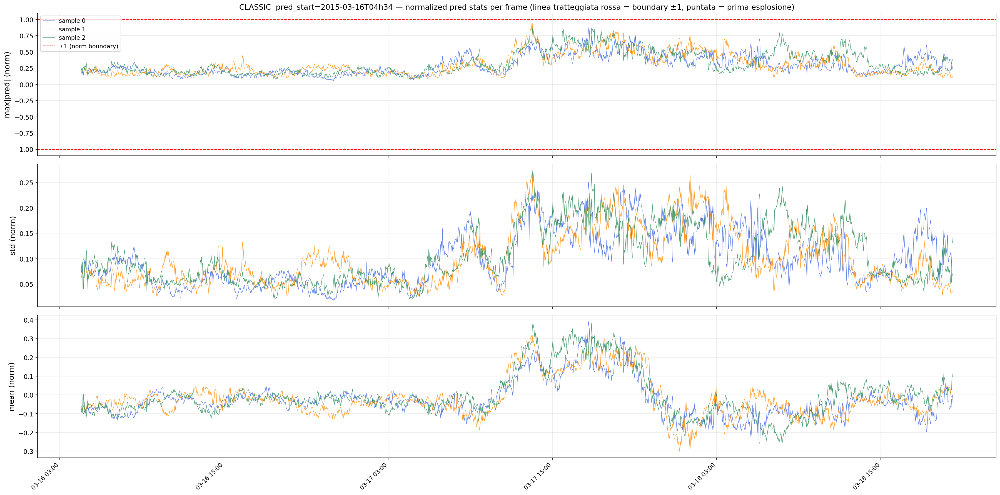

In [7]:
import json

# =============================================================================
# CONFIG
# =============================================================================
MODEL_NAME = "CLASSIC"             # CLASSIC | NOCOND | UNET
PRED_TAG   = "2015-03-16T04h34"   # quale pred_start

BASE        = "/capstor/scratch/cscs/framunno"
COND_FRAMES = 15
FRAME_DT    = 2
NORM_SCALE  = 80000

# =============================================================================
# LOAD
# =============================================================================
pred_dir  = f"{BASE}/results_2015_{MODEL_NAME}_AR50_pred{PRED_TAG}"
pred_path = os.path.join(pred_dir, 'generated_imgs', 'pred_0.npy')
meta_path = os.path.join(pred_dir, 'metadata',       'meta_0.json')

meta = json.load(open(meta_path))
pred = np.load(pred_path, allow_pickle=True).astype(np.float32)   # normalized [-1,1]
if pred.ndim == 3:
    pred = pred[np.newaxis]

n_samples, n_frames, H, W = pred.shape
pred_start = (pd.Timestamp(meta['start_time']).tz_localize('UTC')
              + pd.Timedelta(minutes=COND_FRAMES * FRAME_DT))
times = [pred_start + pd.Timedelta(minutes=FRAME_DT * i) for i in range(n_frames)]

print(f"Model : {MODEL_NAME}  |  pred_start: {pred_start}")
print(f"Shape : {pred.shape}  |  frames: {n_frames}  ({n_frames * FRAME_DT / 60:.1f} h of rollout)")
print(f"Normalized range  min={pred.min():.4f}  max={pred.max():.4f}")
print(f"Denorm [V]        min={pred.min()*NORM_SCALE:.0f}  max={pred.max()*NORM_SCALE:.0f}")

# =============================================================================
# PER-FRAME STATS (per sample)
# =============================================================================
absmax_per = np.abs(pred).max(axis=(-2, -1))   # (n_samples, n_frames)
std_per    = pred.std(axis=(-2, -1))
mean_per   = pred.mean(axis=(-2, -1))

# frame where any sample first exceeds [-1,1]
out_of_range = (np.abs(pred).max(axis=(-2, -1)) > 1.0)  # (n_samples, n_frames)
first_explosion = {s: np.argmax(out_of_range[s]) if out_of_range[s].any() else None
                   for s in range(n_samples)}
for s, fi in first_explosion.items():
    if fi is not None:
        print(f"  sample {s}: first out-of-range at frame {fi}  ({times[fi].strftime('%m-%d %H:%M')})")
    else:
        print(f"  sample {s}: always in range")

# =============================================================================
# PLOT
# =============================================================================
FS = 13
COLORS = ['royalblue', 'darkorange', 'seagreen']

fig, axes = plt.subplots(3, 1, figsize=(24, 12), sharex=True)

for s in range(n_samples):
    c = COLORS[s % len(COLORS)]
    axes[0].plot(times, absmax_per[s],  color=c, lw=0.7, alpha=0.85, label=f'sample {s}')
    axes[1].plot(times, std_per[s],     color=c, lw=0.7, alpha=0.85)
    axes[2].plot(times, mean_per[s],    color=c, lw=0.7, alpha=0.85)

# mark [-1, 1] bounds on absmax
axes[0].axhline(1.0,  color='red', ls='--', lw=1.2, label='±1 (norm boundary)')
axes[0].axhline(-1.0, color='red', ls='--', lw=1.2)

# mark explosion frames
for s, fi in first_explosion.items():
    if fi is not None:
        for ax in axes:
            ax.axvline(times[fi], color=COLORS[s % len(COLORS)], ls=':', lw=1.5, alpha=0.7)

axes[0].set_ylabel('max|pred| (norm)',  fontsize=FS)
axes[1].set_ylabel('std (norm)',        fontsize=FS)
axes[2].set_ylabel('mean (norm)',       fontsize=FS)

for ax in axes:
    ax.grid(alpha=0.25)
    ax.tick_params(labelsize=11)

axes[0].legend(fontsize=10)
axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
axes[-1].xaxis.set_major_locator(mdates.HourLocator(interval=12))
plt.setp(axes[-1].xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=10)

axes[0].set_title(f'{MODEL_NAME}  pred_start={PRED_TAG} — normalized pred stats per frame '
                  f'(linea tratteggiata rossa = boundary ±1, puntata = prima esplosione)',
                  fontsize=FS)
plt.tight_layout()
show(fig, f'2015_debug_{MODEL_NAME}_{PRED_TAG}.png')


In [29]:
import json, io, sys, imageio
from scipy.ndimage import map_coordinates
from matplotlib.gridspec import GridSpec
from IPython.display import Image as IPyImage

sys.path.insert(0, '/users/framunno/projects/ionosphere_diffusion')
from src.data.dataset import latlon_to_cartesian_grid

# =============================================================================
# CONFIG — edit here
# =============================================================================
PRED_TAG      = "2015-03-16T19h52"   # "2015-03-16T04h34" | "2015-03-16T19h52" | "2015-03-17T06h00"
PLOT_CLASSIC  = True                  # set True when CLASSIC results are ready
PLOT_NOCOND   = True
PLOT_UNET     = True
SAMPLE_IDX    = 0                     # diffusion sample index
N_FRAMES      = None                  # None = full rollout
FPS           = 6
SAVE_GIF      = True
SAVE_MP4      = True
GIF_PATH      = f'/tmp/2015_polar_{PRED_TAG}.gif'
MP4_PATH      = f'/tmp/2015_polar_{PRED_TAG}.mp4'
VMAX          = 50000                 # V

BASE        = "/capstor/scratch/cscs/framunno"
COND_FRAMES = 15
FRAME_DT    = 2
NORM_SCALE  = 80000

# =============================================================================
# LOAD PREDICTIONS
# =============================================================================
def _load(tag, model_name):
    d = f"{BASE}/results_2015_{model_name}_AR50_pred{tag}"
    p = os.path.join(d, 'generated_imgs', 'pred_0.npy')
    m = os.path.join(d, 'metadata',       'meta_0.json')
    if not os.path.exists(p):
        print(f"[{model_name}] missing → skipped")
        return None, None
    meta = json.load(open(m))
    arr  = np.load(p, allow_pickle=True).astype(np.float32)
    ps   = (pd.Timestamp(meta['start_time']).tz_localize('UTC')
            + pd.Timedelta(minutes=COND_FRAMES * FRAME_DT))
    print(f"[{model_name}] loaded  shape={arr.shape}  pred_start={ps}")
    return arr, ps

classic_pred, classic_start = _load(PRED_TAG, 'CLASSIC') if PLOT_CLASSIC else (None, None)
nocond_pred,  nocond_start  = _load(PRED_TAG, 'NOCOND')  if PLOT_NOCOND  else (None, None)
unet_pred,    unet_start    = _load(PRED_TAG, 'UNET')    if PLOT_UNET    else (None, None)

pred_start = next(s for s in [classic_start, nocond_start, unet_start] if s is not None)

available = [a for a in [classic_pred, nocond_pred, unet_pred] if a is not None]
assert available, "No model results found — check paths and PLOT_* flags"
T_total = available[0].shape[1]
T       = min(N_FRAMES, T_total) if N_FRAMES else T_total
times   = [pred_start + pd.Timedelta(minutes=FRAME_DT * i) for i in range(T)]
print(f"Animating {T} frames: {times[0].strftime('%m-%d %H:%M')} → {times[-1].strftime('%m-%d %H:%M')} UT")

# =============================================================================
# PRELOAD GT (cartesian) + GT range timeseries
# =============================================================================
print("Preloading GT frames...", end=' ', flush=True)
gt_cache = {}
for t in times:
    idx   = (df['time_map'] - t).abs().argmin()
    fpath = os.path.join(MAPS_DIR, df.iloc[idx]['filename'])
    raw   = np.load(fpath, allow_pickle=True)[0].astype(np.float32)
    gt_cache[t] = latlon_to_cartesian_grid(raw, output_size=128)
print("done")

gt_range_ts = np.array([gt_cache[t].max() - gt_cache[t].min() for t in times])

# =============================================================================
# PRECOMPUTE MODEL RANGE TIMESERIES
# =============================================================================
PANELS = [
    ('Ground Truth', 'black',     None),
    ('CLASSIC',      'royalblue', classic_pred),
    ('NOCOND',       'tomato',    nocond_pred),
    ('UNET',         'seagreen',  unet_pred),
]
panels = [(lbl, col, arr) for lbl, col, arr in PANELS if lbl == 'Ground Truth' or arr is not None]
n_p    = len(panels)
print(f"Panels: {[lbl for lbl, _, _ in panels]}")

model_range_ts = {}
for lbl, col, arr in panels:
    if arr is None:
        continue
    s = SAMPLE_IDX if arr.shape[0] > 1 else 0
    model_range_ts[lbl] = (arr[s, :T].max(axis=(-2,-1)) - arr[s, :T].min(axis=(-2,-1))) * NORM_SCALE

ts_ymax = max(gt_range_ts.max(), *(v.max() for v in model_range_ts.values())) * 1.05

# =============================================================================
# POLAR GRID
# =============================================================================
H_IMG  = 128
max_r  = 24
r_i    = np.linspace(0, max_r, 200)
th_i   = np.linspace(0, 2 * np.pi, 360)
r_grid, theta_grid = np.meshgrid(r_i, th_i)
polar_x    = r_grid * np.cos(theta_grid)
polar_y    = r_grid * np.sin(theta_grid)
col_coords = (polar_x + max_r) / (2 * max_r) * (H_IMG - 1)
row_coords = (polar_y + max_r) / (2 * max_r) * (H_IMG - 1)

def to_polar(frame2d):
    return map_coordinates(frame2d, [row_coords, col_coords],
                           order=1, mode='constant', cval=0)

# =============================================================================
# RENDER FRAMES
# =============================================================================
print(f"Rendering {T} frames × {n_p} panels...", flush=True)
frames_gif = []

for fi in range(T):
    t = times[fi]

    fig = plt.figure(figsize=(5 * n_p + 1, 7))
    gs  = GridSpec(2, n_p + 1,
                   width_ratios=[1] * n_p + [0.05],
                   height_ratios=[3, 1.2],
                   hspace=0.45, wspace=0.35,
                   figure=fig)
    ax_polars = [fig.add_subplot(gs[0, i], polar=True) for i in range(n_p)]
    ax_cbar   = fig.add_subplot(gs[0, n_p])
    ax_ts     = fig.add_subplot(gs[1, :])

    im_last = None
    for ax, (lbl, col, arr) in zip(ax_polars, panels):
        frame = gt_cache[t] if arr is None else np.clip(arr[SAMPLE_IDX if arr.shape[0]>1 else 0, fi] * NORM_SCALE, -3*VMAX, 3*VMAX)
        ax.grid(False)
        im = ax.pcolormesh(theta_grid, r_grid, to_polar(frame),
                           shading='auto', cmap='coolwarm', vmin=-VMAX, vmax=VMAX)
        ax.set_theta_zero_location('S')
        ax.set_theta_direction(1)
        ax.set_title(lbl, fontsize=10, fontweight='bold', color=col, pad=30)
        ax.grid(True, linestyle='--', alpha=0.4)
        ax.set_yticks([0, 10, 20])
        ax.set_yticklabels(['-90°', '-80°', '-70°'], fontsize=7)
        ax.set_xticks(np.radians([0, 90, 180, 270]))
        ax.set_xticklabels(['', '', '', ''])
        for ang, lbl_t in zip([0, 90, 180, 270], ['00', '06', '12', '18']):
            ax.text(np.radians(ang), max_r + 2.5, f'{lbl_t}:00',
                    ha='center', va='center', fontsize=7)
        im_last = im

    plt.colorbar(im_last, cax=ax_cbar).set_label(
        'Potential (V)', fontsize=8, rotation=270, labelpad=13)

    ax_ts.plot(times[:fi+1], gt_range_ts[:fi+1], color='black', lw=1.4, label='GT')
    for lbl, col, arr in panels:
        if arr is None:
            continue
        ax_ts.plot(times[:fi+1], model_range_ts[lbl][:fi+1], color=col, lw=1.2, label=lbl)
    ax_ts.axvline(t, color='gray', lw=1, ls='--', alpha=0.7)
    ax_ts.set_xlim(times[0], times[-1])
    ax_ts.set_ylim(0, ts_ymax)
    ax_ts.set_ylabel('Max−Min [V]', fontsize=9)
    ax_ts.legend(fontsize=8, loc='upper left', ncol=n_p+1)
    ax_ts.grid(alpha=0.25)
    ax_ts.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
    ax_ts.xaxis.set_major_locator(mdates.HourLocator(interval=12))
    plt.setp(ax_ts.xaxis.get_majorticklabels(), rotation=30, ha='right', fontsize=7)

    fig.suptitle(t.strftime('%Y-%m-%d  %H:%M UT'), fontsize=11, y=1.005)

    buf = io.BytesIO()
    fig.savefig(buf, format='png', dpi=100, bbox_inches='tight')
    plt.close(fig)
    buf.seek(0)
    frames_gif.append(imageio.v2.imread(buf))

    if (fi + 1) % 50 == 0:
        print(f"  {fi+1}/{T}", flush=True)

# =============================================================================
# SAVE GIF + MP4
# =============================================================================
if SAVE_GIF:
    imageio.mimsave(GIF_PATH, frames_gif, fps=FPS, loop=0)
    print(f"GIF saved: {GIF_PATH}  ({T} frames, {T/FPS:.0f}s @ {FPS} fps)")

if SAVE_MP4:
    with imageio.get_writer(MP4_PATH, fps=FPS, codec='libx264',
                            quality=8, macro_block_size=2) as writer:
        for frame in frames_gif:
            writer.append_data(frame)
    print(f"MP4 saved: {MP4_PATH}")

IPyImage(GIF_PATH) if SAVE_GIF else None


[CLASSIC] loaded  shape=(3, 1463, 128, 128)  pred_start=2015-03-16 19:52:00+00:00
[NOCOND] loaded  shape=(3, 1463, 128, 128)  pred_start=2015-03-16 19:52:00+00:00
[UNET] loaded  shape=(1, 1463, 128, 128)  pred_start=2015-03-16 19:52:00+00:00
Animating 1463 frames: 03-16 19:52 → 03-18 20:36 UT
Preloading GT frames... 

KeyboardInterrupt: 

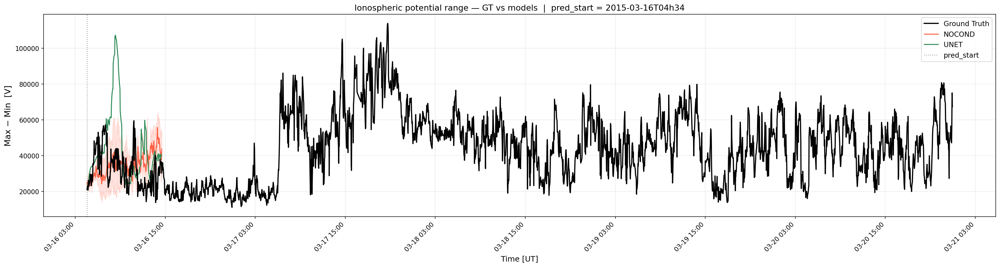

In [19]:
# =============================================================================
# Timeseries: max−min per frame  (usa variabili della cella GIF sopra)
# =============================================================================
STAT_PANELS = [
    ('Ground Truth', 'black',     None,         '-'),
    ('CLASSIC',      'royalblue', classic_pred, '-'),
    ('NOCOND',       'tomato',    nocond_pred,  '-'),
    ('UNET',         'seagreen',  unet_pred,    '-'),
]

# GT: slice dalla pred_start in poi
gt_mask  = stats.index >= pred_start
gt_times = stats.index[gt_mask]
gt_range = stats['range'].values[gt_mask]

fig, ax = plt.subplots(figsize=(22, 6))

# GT
ax.plot(gt_times, gt_range, color='black', lw=1.8, label='Ground Truth', zorder=5)

# Models
for lbl, col, arr, ls in STAT_PANELS[1:]:
    if arr is None:
        continue
    n_samples = arr.shape[0]
    # per-frame max-min across spatial dims, then denorm
    frame_range = (arr.max(axis=(-2, -1)) - arr.min(axis=(-2, -1))) * NORM_SCALE  # (n_samples, T_total)
    mu  = frame_range.mean(axis=0)[:T]
    sig = frame_range.std(axis=0)[:T]
    ax.plot(times, mu, color=col, lw=1.5, ls=ls, label=lbl)
    if n_samples > 1:
        ax.fill_between(times, mu - sig, mu + sig, color=col, alpha=0.18)

ax.axvline(pred_start, color='gray', lw=1.2, ls=':', alpha=0.8, label='pred_start')
ax.set_ylabel('Max − Min  [V]', fontsize=13)
ax.set_xlabel('Time [UT]', fontsize=12)
ax.set_title(f'Ionospheric potential range — GT vs models  |  pred_start = {PRED_TAG}', fontsize=13)
ax.legend(fontsize=11)
ax.grid(alpha=0.25)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=12))
plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=10)
plt.tight_layout()
show(fig, f'2015_range_ts_{PRED_TAG}.png')


## Metriche quantitative — solo evento 2015

Stesse metriche di `compute_metrics_v2.py` (PSNR, SSIM, LPIPS, correlation, CPCP, dist_max/min_px, power spectrum...),
applicate ai rollout AR50 lunghi generati per l'evento 2015 (`results_2015_{MODEL}_AR50_pred{tag}`).

Nota: il `ground_truth/target_0.npy` salvato da `generate_data_v4.py` copre solo la finestra base (35 frame) e NON è
allineato al rollout esteso (fino a ~1900 frame, `--rollout-end-time 2015-03-19`). Per ogni frame del rollout la GT
viene quindi recuperata da `MAPS_DIR` per timestamp più vicino (stessa logica già usata nella cella GIF sopra),
convertita in griglia cartesiana con `latlon_to_cartesian_grid`.

In [30]:
# =============================================================================
# Setup: import delle stesse funzioni di compute_metrics_v2.py + LPIPS
# =============================================================================
import sys, json
sys.path.insert(0, '/users/framunno/projects/ionosphere_diffusion')
from compute_metrics_v2 import compute_metrics_batch
import lpips as lpips_lib
import torch
from tqdm.auto import tqdm

if 'latlon_to_cartesian_grid' not in dir():
    from src.data.dataset import latlon_to_cartesian_grid

BASE        = "/capstor/scratch/cscs/framunno"
PRED_TAGS   = ["2015-03-16T04h34", "2015-03-16T19h52", "2015-03-17T06h00"]
MODEL_DIRS  = {
    'CLASSIC': f"{BASE}/results_2015_CLASSIC_AR50_pred{{tag}}",
    'NOCOND':  f"{BASE}/results_2015_NOCOND_AR50_pred{{tag}}",
    'UNET':    f"{BASE}/results_2015_UNET_AR50_pred{{tag}}",
}
COND_FRAMES  = 15
FRAME_DT     = 2
NORM_SCALE   = 80000
FRAME_STRIDE = 5     # 1 = ogni frame (lento su rollout di ~1900 frame); alza per velocizzare

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Loading LPIPS on {device}...')
lpips_fn = lpips_lib.LPIPS(net='alex', verbose=False).to(device)
lpips_fn.eval()

_gt_cache = {}
def get_gt_frame(t):
    if t not in _gt_cache:
        idx   = (df['time_map'] - t).abs().argmin()
        fpath = os.path.join(MAPS_DIR, df.iloc[idx]['filename'])
        raw   = np.load(fpath, allow_pickle=True)[0].astype(np.float32)
        _gt_cache[t] = latlon_to_cartesian_grid(raw, output_size=128)
    return _gt_cache[t]

def load_pred_2015(tag, model_name):
    d = MODEL_DIRS[model_name].format(tag=tag)
    p = os.path.join(d, 'generated_imgs', 'pred_0.npy')
    m = os.path.join(d, 'metadata',       'meta_0.json')
    if not os.path.exists(p):
        return None
    meta = json.load(open(m))
    arr  = np.load(p, allow_pickle=True).astype(np.float32)  # normalized [-1,1], (n_samples, T, H, W)
    pred_start = (pd.Timestamp(meta['start_time']).tz_localize('UTC')
                  + pd.Timedelta(minutes=COND_FRAMES * FRAME_DT))
    return arr, pred_start

Loading LPIPS on cuda...


/user-environment/env/default/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/user-environment/env/default/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [31]:
# =============================================================================
# Calcolo metriche per ogni (modello, pred_tag, frame)
# =============================================================================
records = []
for tag in PRED_TAGS:
    for model_name in MODEL_DIRS:
        loaded = load_pred_2015(tag, model_name)
        if loaded is None:
            print(f"[{model_name} {tag}] mancante, salto")
            continue
        pred, pred_start = loaded
        n_samples, T, H, W = pred.shape
        times = [pred_start + pd.Timedelta(minutes=FRAME_DT * i) for i in range(T)]

        for fi in tqdm(range(0, T, FRAME_STRIDE), desc=f'{model_name} {tag}'):
            t = times[fi]
            gt_norm = (get_gt_frame(t) / NORM_SCALE).astype(np.float32)
            preds_norm = pred[:, fi]   # (n_samples, H, W)
            sample_metrics = compute_metrics_batch(preds_norm, gt_norm, lpips_fn, device)
            for s, m in enumerate(sample_metrics):
                records.append({
                    'model': model_name, 'pred_tag': tag,
                    'frame_idx': fi, 'sample_idx': s, 'time': t,
                    'hours_since_start': fi * FRAME_DT / 60,
                    **m,
                })

df_2015 = pd.DataFrame(records)

out_dir = '/users/framunno/res_iono/metrics_2015'
os.makedirs(out_dir, exist_ok=True)
df_2015.to_csv(os.path.join(out_dir, 'metrics_per_frame_2015.csv'), index=False)
print(f"Saved: {out_dir}/metrics_per_frame_2015.csv  ({len(df_2015)} record)")

summary = (df_2015.groupby(['model', 'pred_tag'])
           [['psnr', 'ssim', 'lpips', 'correlation', 'cpcp_pct_var', 'dist_max_px', 'ps_log_mse']]
           .mean().reset_index())
summary.to_csv(os.path.join(out_dir, 'metrics_overall_2015.csv'), index=False)
print(summary.to_string(index=False))

CLASSIC 2015-03-16T04h34:   0%|          | 0/383 [00:00<?, ?it/s]

NOCOND 2015-03-16T04h34:   0%|          | 0/383 [00:00<?, ?it/s]

UNET 2015-03-16T04h34:   0%|          | 0/383 [00:00<?, ?it/s]

CLASSIC 2015-03-16T19h52:   0%|          | 0/293 [00:00<?, ?it/s]

NOCOND 2015-03-16T19h52:   0%|          | 0/293 [00:00<?, ?it/s]

UNET 2015-03-16T19h52:   0%|          | 0/293 [00:00<?, ?it/s]

CLASSIC 2015-03-17T06h00:   0%|          | 0/233 [00:00<?, ?it/s]

NOCOND 2015-03-17T06h00:   0%|          | 0/233 [00:00<?, ?it/s]

UNET 2015-03-17T06h00:   0%|          | 0/233 [00:00<?, ?it/s]

Saved: /users/framunno/res_iono/metrics_2015/metrics_per_frame_2015.csv  (6363 record)
  model         pred_tag      psnr     ssim    lpips  correlation  cpcp_pct_var  dist_max_px  ps_log_mse
CLASSIC 2015-03-16T04h34 13.530960 0.396923 0.154822     0.660387     49.180549    23.710401    0.430696
CLASSIC 2015-03-16T19h52 12.938795 0.376573 0.157409     0.640682     48.629450    24.069292    0.416978
CLASSIC 2015-03-17T06h00 14.031174 0.435842 0.140391     0.727783     45.744244    23.668685    0.369231
 NOCOND 2015-03-16T04h34 10.798894 0.281624 0.238049     0.469762     78.619403    26.838654    0.820120
 NOCOND 2015-03-16T19h52 10.782654 0.264301 0.263307     0.442956     64.174425    27.729700    0.916059
 NOCOND 2015-03-17T06h00 11.720224 0.286017 0.232878     0.446038     56.936426    27.453388    0.764636
   UNET 2015-03-16T04h34 13.499294 0.285071 0.280373     0.675957     48.625554    20.774947    1.797775
   UNET 2015-03-16T19h52 13.271066 0.299402 0.278464     0.694136     44.

In [11]:
df_2015.columns

Index(['model', 'pred_tag', 'frame_idx', 'sample_idx', 'time',
       'hours_since_start', 'mse', 'mae', 'rmse', 'correlation', 'psnr',
       'ssim', 'lpips', 'rel_l2', 'nrmse', 'mean_error', 'std_ratio',
       'cpcp_pred', 'cpcp_gt', 'cpcp_pct_var', 'pcpc', 'dr_pred_V', 'dr_gt_V',
       'dist_max_px', 'dist_min_px', 'ps_log_mse', 'ps_log_rel_l2',
       'ps_rel_error_filtered', 'ps_nmse', 'efield_rms_pred', 'efield_rms_gt',
       'efield_rms_ratio', 'efield_mag_mae', 'efield_mag_corr'],
      dtype='object')

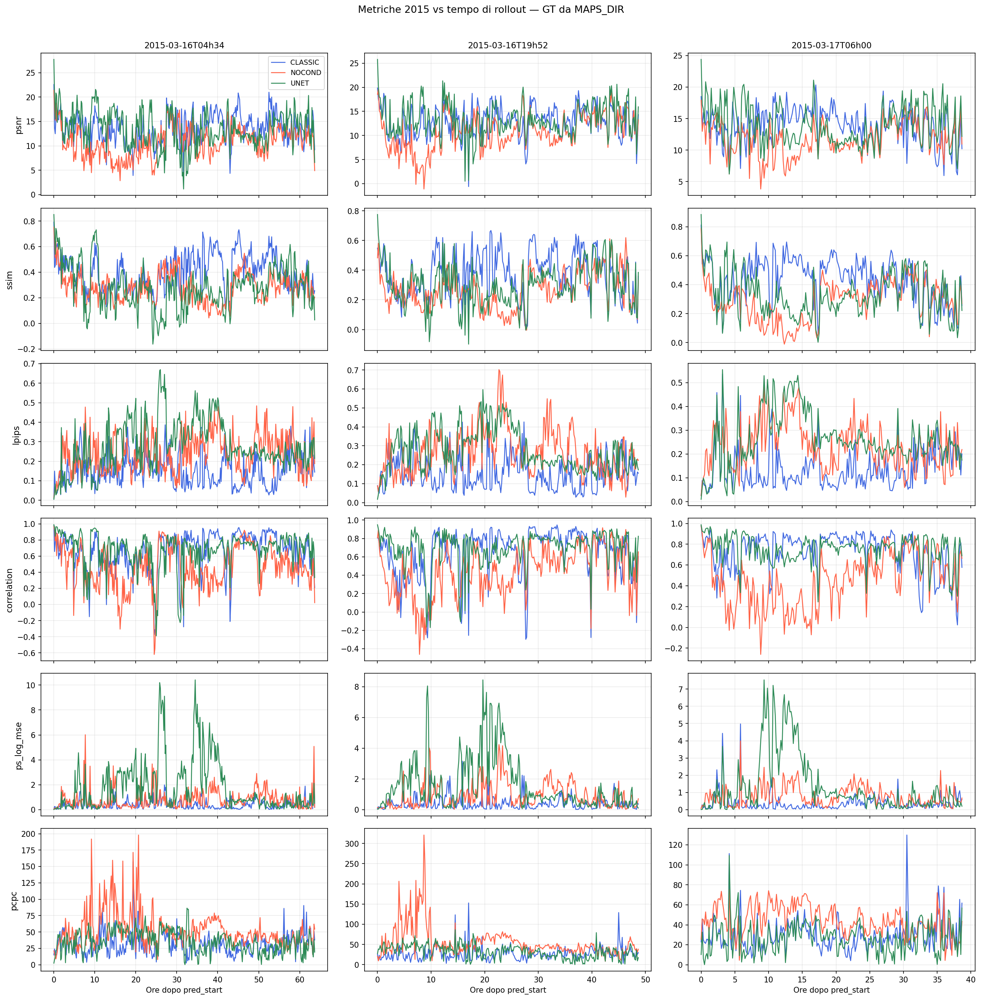

In [32]:
# =============================================================================
# Plot: metriche vs ore dopo pred_start, per modello e per finestra
# =============================================================================
KEY_METRICS  = ['psnr', 'ssim', 'lpips', 'correlation', 'ps_log_mse', 'pcpc']
MODEL_COLORS = {'CLASSIC': 'royalblue', 'NOCOND': 'tomato', 'UNET': 'seagreen'}

fig, axes = plt.subplots(len(KEY_METRICS), len(PRED_TAGS),
                          figsize=(6 * len(PRED_TAGS), 3 * len(KEY_METRICS)), sharex='col')

for col, tag in enumerate(PRED_TAGS):
    sub_tag = df_2015[df_2015['pred_tag'] == tag]
    for row, metric in enumerate(KEY_METRICS):
        ax = axes[row, col]
        for model_name, color in MODEL_COLORS.items():
            g = sub_tag[sub_tag['model'] == model_name].groupby('hours_since_start')[metric].mean()
            if len(g) == 0:
                continue
            ax.plot(g.index, g.values, color=color, lw=1.2, label=model_name)
        if row == 0:
            ax.set_title(tag, fontsize=11)
        if col == 0:
            ax.set_ylabel(metric, fontsize=11)
        ax.grid(alpha=0.25)

axes[0, 0].legend(fontsize=9)
for ax in axes[-1]:
    ax.set_xlabel('Ore dopo pred_start', fontsize=10)
fig.suptitle('Metriche 2015 vs tempo di rollout — GT da MAPS_DIR', fontsize=13, y=1.01)
plt.tight_layout()
show(fig, '2015_metrics_vs_time.png')

## Confronto modelli più leggibile: finestre orarie, baseline e ranking

Idee applicate qui sotto:
1. **Baseline di persistenza** — "predizione" = ultimo frame di condizionamento ripetuto per tutto il rollout.
   Senza questo riferimento non si sa se un modello sta davvero prevedendo qualcosa o sta solo restando vicino
   ai valori iniziali (che su un rollout di 60+ ore può bastare a dare SSIM/PSNR "decenti" senza essere utile).
2. **Raggruppamento per finestra oraria** (0-3h, 3-6h, 6-12h, 12-24h, 24-48h, 48h+) invece del grafico continuo
   per frame — più leggibile e in linea con come si riportano gli orizzonti di forecast in letteratura.
3. **Tabelle colorate (verde=migliore, rosso=peggiore)** per riga, così il modello migliore salta subito all'occhio.
4. **Conteggio "vittorie"** su tutte le combinazioni (metrica × finestra × pred_tag) → un unico numero per modello.
5. **Forecast horizon**: ore prima che SSIM scenda sotto una soglia — risponde direttamente a "per quanto tempo
   il modello resta utile", più intuitivo di guardare 6 curve insieme.

In [33]:
# =============================================================================
# Baseline di persistenza: ultimo frame di condizionamento ripetuto nel tempo
# =============================================================================
persistence_records = []
for tag in df_2015['pred_tag'].unique():
    tag_times = sorted(df_2015[df_2015['pred_tag'] == tag]['time'].unique())
    pred_start_tag = pd.Timestamp(tag_times[0])
    persisted_gt   = get_gt_frame(pred_start_tag - pd.Timedelta(minutes=FRAME_DT))
    persisted_norm = (persisted_gt / NORM_SCALE).astype(np.float32)[None]  # (1, H, W)

    for t in tqdm(tag_times, desc=f'persistence {tag}'):
        gt_norm = (get_gt_frame(t) / NORM_SCALE).astype(np.float32)
        m = compute_metrics_batch(persisted_norm, gt_norm, lpips_fn, device)[0]
        hrs = (pd.Timestamp(t) - pred_start_tag).total_seconds() / 3600
        persistence_records.append({
            'model': 'PERSISTENCE', 'pred_tag': tag,
            'frame_idx': -1, 'sample_idx': 0, 'time': t,
            'hours_since_start': hrs,
            **m,
        })

df_2015_full = pd.concat([df_2015, pd.DataFrame(persistence_records)], ignore_index=True)
df_2015_full.to_csv(os.path.join(out_dir, 'metrics_per_frame_2015_with_baseline.csv'), index=False)
print(f"Aggiunti {len(persistence_records)} record PERSISTENCE su {df_2015_full['pred_tag'].nunique()} pred_tag")

persistence 2015-03-16T04h34:   0%|          | 0/383 [00:00<?, ?it/s]

persistence 2015-03-16T19h52:   0%|          | 0/293 [00:00<?, ?it/s]

persistence 2015-03-17T06h00:   0%|          | 0/233 [00:00<?, ?it/s]

Aggiunti 909 record PERSISTENCE su 3 pred_tag


In [34]:
# =============================================================================
# Binning orario + tabelle colorate (verde = migliore, per riga) — per pred_tag
# =============================================================================
HORIZON_BINS   = [0, 3, 6, 12, 24, 48, np.inf]
HORIZON_LABELS = ['0-3h', '3-6h', '6-12h', '12-24h', '24-48h', '48h+']

df_2015_full['horizon'] = pd.cut(df_2015_full['hours_since_start'],
                                  bins=HORIZON_BINS, labels=HORIZON_LABELS, right=False)

METRIC_DIRECTION = {   # True = più alto è meglio, False = più basso è meglio
    'psnr': True, 'ssim': True, 'correlation': True,
    'lpips': False, 'cpcp_pct_var': False, 'pcpc': False,
    'dist_max_px': False, 'ps_log_mse': False, 'rel_l2': False,
}

def heatmap_table(metric, include_persistence=True, by_tag=True):
    d = df_2015_full if include_persistence else df_2015_full[df_2015_full['model'] != 'PERSISTENCE']
    group_cols = ['pred_tag', 'horizon', 'model'] if by_tag else ['horizon', 'model']
    piv = d.groupby(group_cols, observed=True)[metric].mean().unstack('model')
    cmap = 'RdYlGn' if METRIC_DIRECTION.get(metric, True) else 'RdYlGn_r'
    caption = f'{metric}' + (' (per pred_tag)' if by_tag else ' (media sulle 3 finestre storm)')
    return piv.style.background_gradient(cmap=cmap, axis=1).format('{:.3f}', na_rep='—').set_caption(caption)

for metric in ['ssim', 'psnr', 'lpips', 'correlation']:
    display(heatmap_table(metric, by_tag=True))

In [35]:
# =============================================================================
# Stessa cosa ma aggregata sulle 3 finestre storm — la vista "chi vince overall"
# =============================================================================
for metric in ['ssim', 'psnr', 'lpips', 'correlation']:
    display(heatmap_table(metric, by_tag=False))

model,CLASSIC,NOCOND,PERSISTENCE,UNET
horizon,,,,
0-3h,0.463,0.375,0.498,0.509
3-6h,0.319,0.270,0.383,0.340
6-12h,0.396,0.214,0.259,0.327
12-24h,0.410,0.235,0.306,0.247
24-48h,0.401,0.305,0.280,0.283
48h+,0.392,0.281,0.396,0.325


model,CLASSIC,NOCOND,PERSISTENCE,UNET
horizon,,,,
0-3h,14.481,13.141,15.062,16.379
3-6h,12.333,9.677,11.356,14.023
6-12h,13.424,8.447,9.577,14.638
12-24h,13.315,9.955,11.335,12.954
24-48h,13.529,12.127,10.746,13.121
48h+,13.686,11.594,13.406,13.637


model,CLASSIC,NOCOND,PERSISTENCE,UNET
horizon,,,,
0-3h,0.123,0.182,0.102,0.126
3-6h,0.172,0.190,0.140,0.217
6-12h,0.152,0.254,0.186,0.270
12-24h,0.152,0.272,0.174,0.339
24-48h,0.151,0.238,0.175,0.282
48h+,0.161,0.264,0.119,0.232


model,CLASSIC,NOCOND,PERSISTENCE,UNET
horizon,,,,
0-3h,0.733,0.614,0.775,0.867
3-6h,0.518,0.325,0.540,0.722
6-12h,0.612,0.264,0.274,0.675
12-24h,0.679,0.354,0.404,0.680
24-48h,0.686,0.554,0.432,0.690
48h+,0.712,0.491,0.654,0.719


In [36]:
# =============================================================================
# Finestra "storm peak" fissa in tempo assoluto (17 mar 06:30 -> 18 mar 10:00 UT).
# Essendo fissa in tempo assoluto ma i plot sono in "ore da pred_start", per ogni
# pred_tag ricalcolo a quali ore-da-inizio corrisponde, per evidenziarla nei bar chart.
# =============================================================================
STORM_START = pd.Timestamp('2015-03-17 06:30', tz='UTC')
STORM_END   = pd.Timestamp('2015-03-18 03:00', tz='UTC')

LABEL_EDGES = dict(zip(HORIZON_LABELS, zip(HORIZON_BINS[:-1], HORIZON_BINS[1:])))

def storm_window_hours(tag):
    pred_start_tag = df_2015_full[df_2015_full['pred_tag'] == tag]['time'].min()
    h0 = max(0.0, (STORM_START - pred_start_tag).total_seconds() / 3600)
    h1 = (STORM_END - pred_start_tag).total_seconds() / 3600
    return h0, h1

def storm_bin_span(tag, labels):
    """Indici (idx_lo, idx_hi) in 'labels' che coprono la finestra storm per questo tag, o None."""
    h0, h1 = storm_window_hours(tag)
    idxs = [i for i, lbl in enumerate(labels)
            if LABEL_EDGES[lbl][0] < h1 and LABEL_EDGES[lbl][1] > h0]
    return (min(idxs), max(idxs)) if idxs else None

for tag in PRED_TAGS:
    h0, h1 = storm_window_hours(tag)
    print(f"{tag}: storm peak a +{h0:.1f}h .. +{h1:.1f}h dall'inizio della predizione")

2015-03-16T04h34: storm peak a +25.9h .. +46.4h dall'inizio della predizione
2015-03-16T19h52: storm peak a +10.6h .. +31.1h dall'inizio della predizione
2015-03-17T06h00: storm peak a +0.2h .. +20.7h dall'inizio della predizione


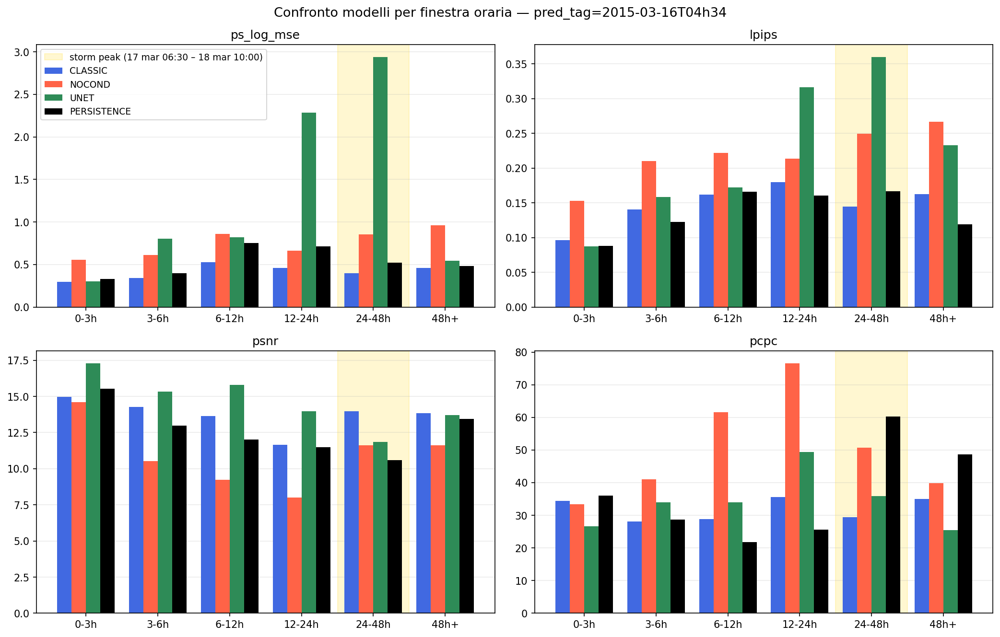

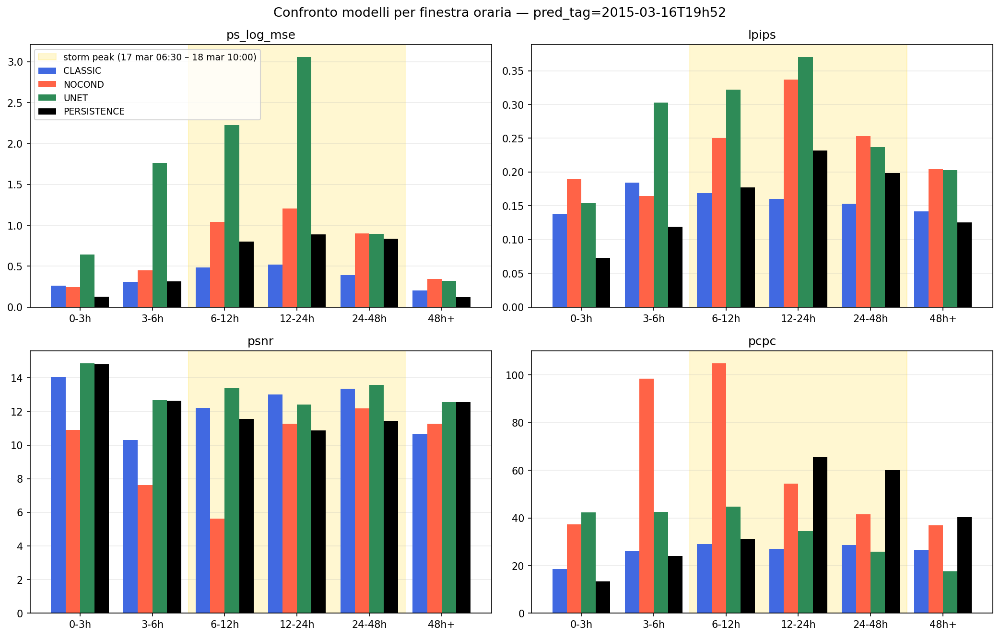

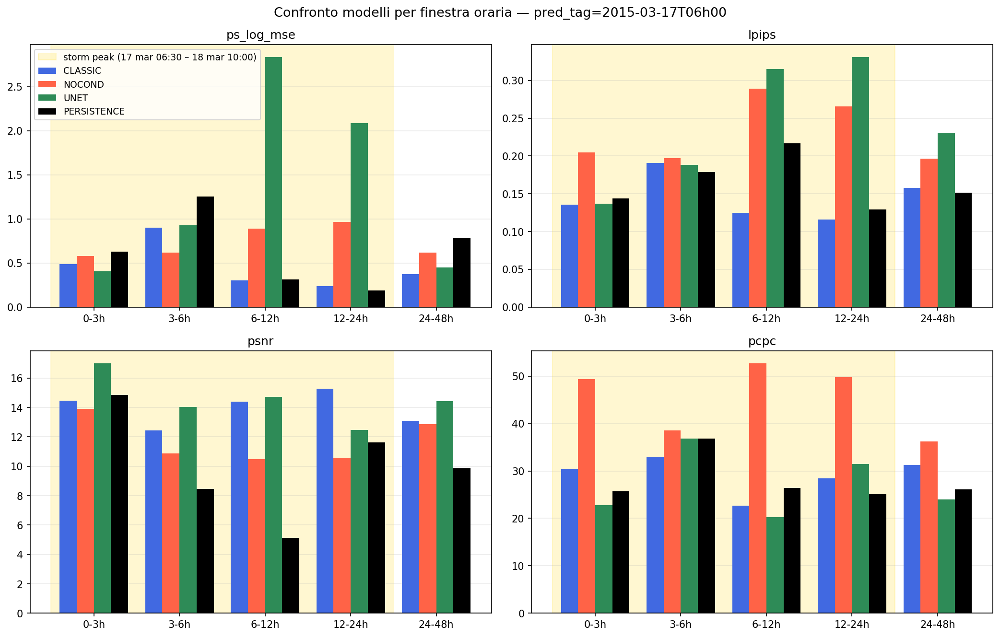

In [ ]:
# =============================================================================
# Bar chart per pred_tag (nessuna media tra finestre storm) — persistenza come barra nera
# solo le finestre orarie con dati vengono mostrate + riquadro sul periodo storm peak
# =============================================================================
BAR_METRICS   = ['ps_log_mse', 'lpips', 'psnr', 'pcpc']   # tutte "lower is better" tranne psnr
MODEL_ORDER   = ['CLASSIC', 'NOCOND', 'UNET', 'PERSISTENCE']
MODEL_COLORS2 = {'CLASSIC': 'royalblue', 'NOCOND': 'tomato', 'UNET': 'seagreen', 'PERSISTENCE': 'black'}

ncols = 2
nrows = int(np.ceil(len(BAR_METRICS) / ncols))

for tag in PRED_TAGS:
    d_tag = df_2015_full[df_2015_full['pred_tag'] == tag]
    tag_labels = [lbl for lbl in HORIZON_LABELS if (d_tag['horizon'] == lbl).any()]
    x_tag = np.arange(len(tag_labels))
    width = 0.8 / len(MODEL_ORDER)
    span = storm_bin_span(tag, tag_labels)

    fig, axes = plt.subplots(nrows, ncols, figsize=(7 * ncols, 4.5 * nrows))
    axes = np.atleast_1d(axes).flatten()

    for ax_i, (ax, metric) in enumerate(zip(axes, BAR_METRICS)):
        if span is not None:
            ax.axvspan(span[0] - 0.5, span[1] + 0.5, color='gold', alpha=0.18, zorder=0,
                       label='storm peak (17 mar 06:30 – 18 mar 10:00)' if ax_i == 0 else None)

        agg = (d_tag.groupby(['horizon', 'model'], observed=True)[metric].mean()
                    .unstack('model').reindex(tag_labels))
        for i, model_name in enumerate(MODEL_ORDER):
            if model_name not in agg.columns:
                continue
            offset = (i - (len(MODEL_ORDER) - 1) / 2) * width
            ax.bar(x_tag + offset, agg[model_name].values, width,
                   label=model_name if ax_i == 0 else None, color=MODEL_COLORS2[model_name], zorder=2)
        ax.set_xticks(x_tag)
        ax.set_xticklabels(tag_labels)
        ax.set_title(metric, fontsize=12)
        ax.grid(alpha=0.25, axis='y', zorder=0)

    for ax in axes[len(BAR_METRICS):]:
        ax.axis('off')

    axes[0].legend(fontsize=9)
    fig.suptitle(f'Confronto modelli per finestra oraria — pred_tag={tag}', fontsize=13)
    plt.tight_layout()
    show(fig, f'2015_metrics_by_horizon_bar_{tag}.png')

## Timeseries scalari GT vs predizioni (max, min, range, CPCP, mean, std)

Per ogni frame valutato riduco il campo 2D (128×128, in volt fisici) a 6 statistiche scalari, sia per la GT
(da `get_gt_frame`, cartesiana — coerente con le predizioni) sia per le predizioni (media sui sample per i
modelli diffusion). Serve come base per il confronto GT-vs-modello con correlazione/RMSE discusso sopra.

In [37]:
# =============================================================================
# Timeseries scalari: max, min, range (max-min), CPCP (p75-p25), mean, std
# Un record per sample (non pre-mediato) cosi' posso fare mean+std tra i 3 sample
# diffusion (CLASSIC/NOCOND) per gli error bar. UNET ha 1 solo sample -> std=NaN.
# =============================================================================
STAT_NAMES = ['max', 'min', 'range', 'cpcp', 'mean', 'std']

def scalar_stats(field):
    p75, p25 = np.percentile(field, 75), np.percentile(field, 25)
    return {
        'max':   float(field.max()),
        'min':   float(field.min()),
        'range': float(field.max() - field.min()),
        'cpcp':  float(p75 - p25),
        'mean':  float(field.mean()),
        'std':   float(field.std()),
    }

ts_records = []
for tag in PRED_TAGS:
    tag_times = sorted(df_2015_full[df_2015_full['pred_tag'] == tag]['time'].unique())
    pred_start_tag = pd.Timestamp(tag_times[0])

    # --- GT: una timeseries per pred_tag (indipendente dal modello) ---
    for t in tag_times:
        gt_phys = get_gt_frame(t)
        hrs = (pd.Timestamp(t) - pred_start_tag).total_seconds() / 3600
        ts_records.append({'series': 'GT', 'model': 'GT', 'pred_tag': tag,
                            'time': t, 'hours_since_start': hrs, 'sample_idx': -1,
                            **scalar_stats(gt_phys)})

    # --- Predizioni: un record per sample per frame valutato ---
    for model_name in MODEL_DIRS:
        loaded = load_pred_2015(tag, model_name)
        if loaded is None:
            continue
        pred, _ = loaded
        n_samples, T, H, W = pred.shape
        times = [pred_start_tag + pd.Timedelta(minutes=FRAME_DT * i) for i in range(T)]

        for fi in range(0, T, FRAME_STRIDE):
            t = times[fi]
            hrs = fi * FRAME_DT / 60
            pred_phys = pred[:, fi] * NORM_SCALE   # (n_samples, H, W)
            for s in range(n_samples):
                ts_records.append({'series': 'PRED', 'model': model_name, 'pred_tag': tag,
                                    'time': t, 'hours_since_start': hrs, 'sample_idx': s,
                                    **scalar_stats(pred_phys[s])})

ts_df = pd.DataFrame(ts_records)
ts_df.to_csv(os.path.join(out_dir, 'scalar_timeseries_2015.csv'), index=False)
print(f"Timeseries: {len(ts_df)} righe "
      f"(GT: {(ts_df['series']=='GT').sum()}, PRED: {(ts_df['series']=='PRED').sum()})")
ts_df.head()

Timeseries: 7272 righe (GT: 909, PRED: 6363)


,series,model,pred_tag,time,hours_since_start,sample_idx,max,min,range,cpcp,mean,std
0,GT,GT,2015-03-16T04h34,2015-03-16 04:34:00+00:00,0.000000,-1,7231.119519,-14004.834955,21235.954474,10993.098385,-5637.155059,5466.785383
1,GT,GT,2015-03-16T04h34,2015-03-16 04:44:00+00:00,0.166667,-1,8896.090947,-13175.031472,22071.122419,8945.963468,-4393.784813,4878.747792
2,GT,GT,2015-03-16T04h34,2015-03-16 04:54:00+00:00,0.333333,-1,11378.589596,-13008.371745,24386.961341,7796.898402,-3225.592050,5317.043347
3,GT,GT,2015-03-16T04h34,2015-03-16 05:04:00+00:00,0.500000,-1,8264.161858,-19718.737586,27982.899444,14179.179990,-6968.686384,7420.714228
4,GT,GT,2015-03-16T04h34,2015-03-16 05:14:00+00:00,0.666667,-1,9141.964841,-20337.675025,29479.639867,14786.447861,-7067.402111,7571.350896


## Confronto GT vs predizione sulle timeseries scalari

Per ogni `(pred_tag, model, statistica)` confronto la timeseries GT e quella predetta (stessi timestamp):
- **correlation** — quanto bene segue la forma/andamento (indipendente da scala e bias)
- **rmse / nrmse** — quanto è sbagliata in valore assoluto (nrmse = rmse / std della GT, per confrontare
  statistiche con scale diverse, es. `mean` vs `range`)
- **best_lag** — di quanti frame/ore va spostata la predizione per massimizzare la correlazione con la GT
  (utile per capire se il modello è "giusto ma in ritardo/anticipo" invece che sbagliato nella forma)

In [38]:
# =============================================================================
# Correlazione + RMSE/NRMSE + lag ottimale, per ogni (pred_tag, model, statistica)
# (media sui sample diffusion prima del confronto con la GT)
# =============================================================================
from scipy.signal import correlate

comparison_records = []
for tag in PRED_TAGS:
    gt_sub = ts_df[(ts_df['pred_tag'] == tag) & (ts_df['series'] == 'GT')].groupby('time')

    for model_name in MODEL_DIRS:
        pred_sub = ts_df[(ts_df['pred_tag'] == tag) & (ts_df['model'] == model_name)].groupby('time')
        common_times = sorted(set(gt_sub.groups) & set(pred_sub.groups))
        if len(common_times) < 2:
            continue

        for stat in STAT_NAMES:
            g = gt_sub[stat].mean().loc[common_times].values.astype(np.float64)
            p = pred_sub[stat].mean().loc[common_times].values.astype(np.float64)  # media sui sample

            corr  = float(np.corrcoef(g, p)[0, 1])
            rmse  = float(np.sqrt(np.mean((g - p) ** 2)))
            nrmse = float(rmse / (g.std() + 1e-8))

            g_norm = (g - g.mean()) / (g.std() + 1e-8)
            p_norm = (p - p.mean()) / (p.std() + 1e-8)
            xcorr  = correlate(p_norm, g_norm, mode='full') / len(g)
            lags   = np.arange(-len(g) + 1, len(g))
            best_lag_steps = int(lags[np.argmax(xcorr)])
            best_lag_hours = best_lag_steps * FRAME_STRIDE * FRAME_DT / 60

            comparison_records.append({
                'pred_tag': tag, 'model': model_name, 'stat': stat,
                'correlation': corr, 'rmse': rmse, 'nrmse': nrmse,
                'best_lag_steps': best_lag_steps, 'best_lag_hours': best_lag_hours,
            })

comparison_df = pd.DataFrame(comparison_records)
comparison_df.to_csv(os.path.join(out_dir, 'scalar_timeseries_comparison_2015.csv'), index=False)
print(f"Saved: {out_dir}/scalar_timeseries_comparison_2015.csv")

print('\n=== Correlazione (media sui 3 pred_tag) ===')
display(comparison_df.groupby(['model', 'stat'])['correlation'].mean().unstack('stat')
        .style.background_gradient(cmap='RdYlGn', axis=0).format('{:.3f}'))

print('\n=== NRMSE (media sui 3 pred_tag, più basso = meglio) ===')
display(comparison_df.groupby(['model', 'stat'])['nrmse'].mean().unstack('stat')
        .style.background_gradient(cmap='RdYlGn_r', axis=0).format('{:.3f}'))

print('\n=== Lag ottimale in ore (media sui 3 pred_tag, 0 = nessuno sfasamento) ===')
display(comparison_df.groupby(['model', 'stat'])['best_lag_hours'].mean().unstack('stat')
        .style.format('{:.1f}'))

Saved: /users/framunno/res_iono/metrics_2015/scalar_timeseries_comparison_2015.csv

=== Correlazione (media sui 3 pred_tag) ===


stat,cpcp,max,mean,min,range,std
model,,,,,,
CLASSIC,0.567,0.749,0.761,0.548,0.665,0.668
NOCOND,0.019,-0.075,0.201,0.209,-0.141,-0.053
UNET,0.437,0.635,0.628,0.466,0.731,0.665



=== NRMSE (media sui 3 pred_tag, più basso = meglio) ===


stat,cpcp,max,mean,min,range,std
model,,,,,,
CLASSIC,0.917,0.677,0.648,0.969,0.841,0.867
NOCOND,1.354,1.198,0.986,1.163,1.452,1.458
UNET,1.153,0.846,0.790,1.076,0.968,1.031



=== Lag ottimale in ore (media sui 3 pred_tag, 0 = nessuno sfasamento) ===


stat,cpcp,max,mean,min,range,std
model,,,,,,
CLASSIC,-0.6,-0.2,-0.9,-0.2,0.0,-0.2
NOCOND,-2.9,-14.2,-12.8,1.3,6.8,-2.1
UNET,-2.1,-1.9,-1.1,0.4,-0.3,-0.2


## Line plot: GT vs predizioni sulle 6 timeseries scalari

Per CLASSIC/NOCOND (3 sample diffusion) la banda ombreggiata è ±1 std tra i sample; UNET ha 1 solo
sample quindi solo la linea. Prima i 3 plot per singolo `pred_tag` (asse tempo assoluto), poi 1 plot
con la media sulle 3 finestre storm (asse: ore da pred_start — la banda lì somma sia la variabilità
tra sample che quella tra le 3 finestre storm).

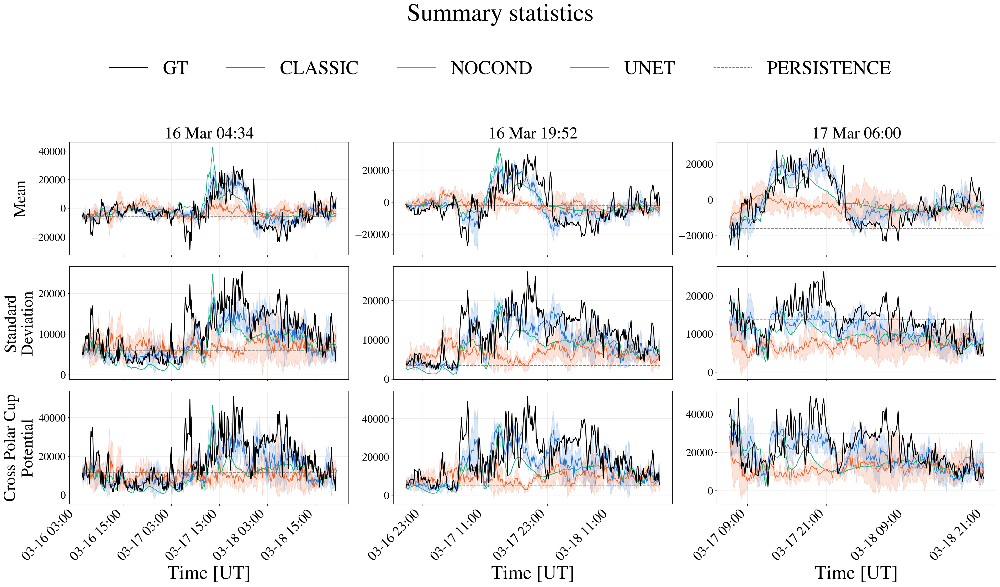

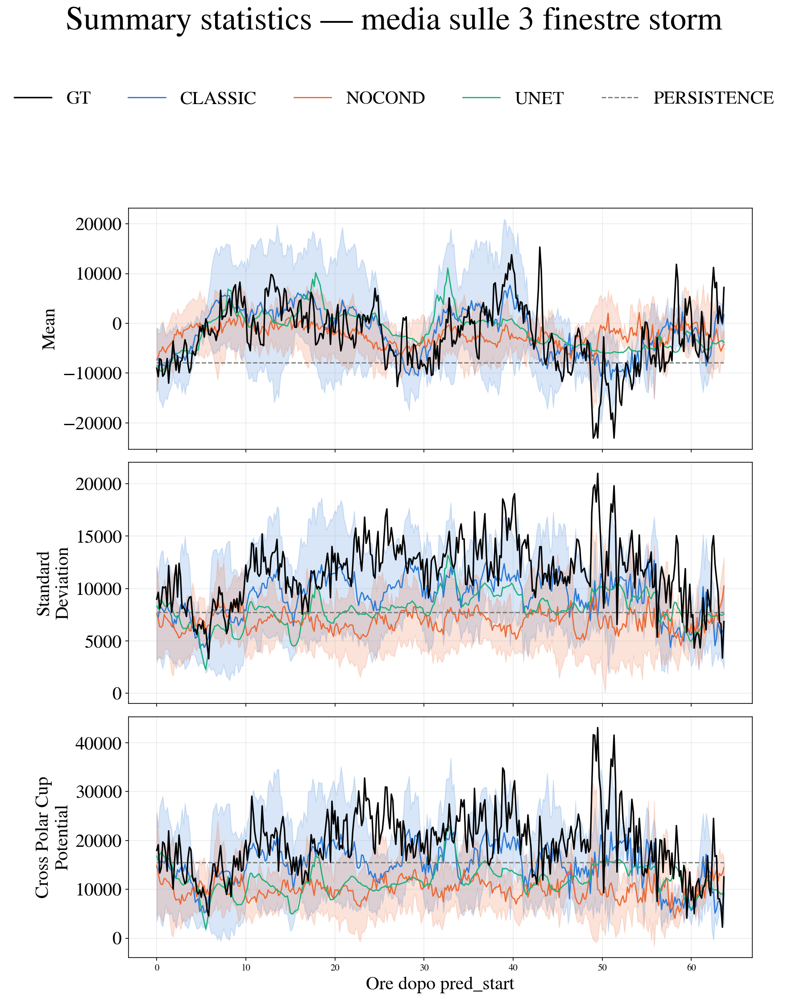

In [85]:
# =============================================================================
# Line plot GT vs modelli — griglia unica: colonne = pred_tag, righe = mean/std/cpcp
# error bar (±1 std tra sample) per CLASSIC/NOCOND, solo linea per UNET (1 sample)
# PERSISTENCE in grigio: e' costante (l'ultimo frame di condizionamento ripetuto)
# stesso stile del bar chart NRMSE: colori validati, legenda fuori dal plot, font
# =============================================================================
MODEL_ORDER   = ['CLASSIC', 'NOCOND', 'UNET']
MODEL_COLORS3 = {'CLASSIC': '#2a78d6', 'NOCOND': '#eb6834', 'UNET': '#1baf7a', 'PERSISTENCE': '#7a7a76'}
STAT_ROWS     = ['mean', 'std', 'cpcp']   # sottoinsieme di STAT_NAMES da plottare
STAT_DISPLAY_NAMES = {'cpcp': 'Cross Polar Cup\nPotential', 'mean': 'Mean', 'std': 'Standard\nDeviation'}

def _plot_one(ax, data, x_col, stat, persistence_val=None):
    gt = data[data['series'] == 'GT'].groupby(x_col)[stat].mean().sort_index()
    ax.plot(gt.index, gt.values, color='black', lw=1.6, label='GT', zorder=5)

    for model_name in MODEL_ORDER:
        sub = data[data['model'] == model_name]
        if sub.empty:
            continue
        g = sub.groupby(x_col)[stat]
        mu  = g.mean().sort_index()
        sig = g.std().sort_index().fillna(0.0)
        ax.plot(mu.index, mu.values, color=MODEL_COLORS3[model_name], lw=1.3, label=model_name)
        if model_name != 'UNET':   # UNET: 1 solo sample, nessuna banda
            ax.fill_between(mu.index, mu.values - sig.values, mu.values + sig.values,
                             color=MODEL_COLORS3[model_name], alpha=0.18)

    if persistence_val is not None:   # costante: l'ultimo frame di condizionamento ripetuto
        # segmento, non axhline: deve coprire solo l'intervallo [inizio, fine] della GT, non tutto l'asse
        ax.plot([gt.index.min(), gt.index.max()], [persistence_val, persistence_val],
               color=MODEL_COLORS3['PERSISTENCE'], lw=1.3, ls='--', label='PERSISTENCE', zorder=4)

    ax.grid(alpha=0.25)
    ax.tick_params(axis='y', labelsize=20)

# --- 1) griglia unica: colonne = pred_tag, righe = STAT_ROWS (asse: tempo assoluto) ---
fig, axes = plt.subplots(len(STAT_ROWS), len(PRED_TAGS),
                          figsize=(8.5 * len(PRED_TAGS), 4.2 * len(STAT_ROWS)), sharex='col', dpi=300)

persisted_by_tag = {}
for tag in PRED_TAGS:
    gt_by_time = ts_df[(ts_df['pred_tag'] == tag) & (ts_df['series'] == 'GT')].set_index('time')
    pred_start_tag = gt_by_time.index.min()
    persisted_by_tag[tag] = scalar_stats(get_gt_frame(pred_start_tag - pd.Timedelta(minutes=FRAME_DT)))

TAG_SHORT_LABELS = {t: pd.Timestamp(t.replace('T', ' ').replace('h', ':')).strftime('%d %b %H:%M')
                    for t in PRED_TAGS}

for col, tag in enumerate(PRED_TAGS):
    data = ts_df[ts_df['pred_tag'] == tag]
    for row, stat in enumerate(STAT_ROWS):
        ax = axes[row, col]
        _plot_one(ax, data, x_col='time', stat=stat, persistence_val=persisted_by_tag[tag][stat])
        if row == 0:
            ax.set_title(TAG_SHORT_LABELS[tag], fontsize=30)
        if col == 0:
            ax.set_ylabel(STAT_DISPLAY_NAMES.get(stat, stat), fontsize=30)

    ax_bottom = axes[-1, col]
    ax_bottom.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
    ax_bottom.xaxis.set_major_locator(mdates.HourLocator(interval=12))
    plt.setp(ax_bottom.xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=25)
    ax_bottom.set_xlabel('Time [UT]', fontsize=35)

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.1),
           ncol=len(MODEL_ORDER) + 2, fontsize=35, frameon=False)
fig.suptitle('Summary statistics', fontsize=45, y=1.18)
plt.tight_layout()
show(fig, '2015_scalar_ts_grid.png')

# --- 2) media sulle 3 finestre storm (asse: ore da pred_start) ---
# PERSISTENCE qui e' la media dei 3 valori costanti (uno per pred_tag)
fig, axes = plt.subplots(len(STAT_ROWS), 1, figsize=(11, 4.2 * len(STAT_ROWS)), sharex=True, dpi=300)
for ax, stat in zip(axes, STAT_ROWS):
    persistence_mean = float(np.mean([persisted_by_tag[tag][stat] for tag in PRED_TAGS]))
    _plot_one(ax, ts_df, x_col='hours_since_start', stat=stat, persistence_val=persistence_mean)
    ax.set_ylabel(STAT_DISPLAY_NAMES.get(stat, stat), fontsize=20)
axes[-1].set_xlabel('Ore dopo pred_start', fontsize=20)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.1),
           ncol=len(MODEL_ORDER) + 2, fontsize=20, frameon=False)
fig.suptitle('Summary statistics — media sulle 3 finestre storm', fontsize=35, y=1.18)
plt.tight_layout()
show(fig, '2015_scalar_ts_mean_over_tags.png')

## Correlazione / NRMSE per finestra oraria (stessi bin usati per le metriche pixel-wise)

Bin solo NRMSE e correlazione: il lag ottimale resta calcolato sulla traiettoria intera (sopra) perché
su finestre corte (es. `0-3h` ≈ 18 punti con `FRAME_STRIDE=5`) la cross-correlazione è troppo rumorosa
per dare un lag affidabile.

In [14]:
# =============================================================================
# NRMSE + correlazione per (pred_tag, model, stat, finestra oraria)
# =============================================================================
ts_df['horizon'] = pd.cut(ts_df['hours_since_start'], bins=HORIZON_BINS,
                           labels=HORIZON_LABELS, right=False)

MIN_POINTS_PER_BIN = 3   # sotto questa soglia corr/nrmse non sono affidabili, salto

comparison_by_horizon_records = []
for tag in PRED_TAGS:
    for horizon in HORIZON_LABELS:
        gt_sub = (ts_df[(ts_df['pred_tag'] == tag) & (ts_df['series'] == 'GT') &
                        (ts_df['horizon'] == horizon)].groupby('time'))
        for model_name in MODEL_DIRS:
            pred_sub = (ts_df[(ts_df['pred_tag'] == tag) & (ts_df['model'] == model_name) &
                              (ts_df['horizon'] == horizon)].groupby('time'))
            common_times = sorted(set(gt_sub.groups) & set(pred_sub.groups))
            if len(common_times) < MIN_POINTS_PER_BIN:
                continue

            for stat in STAT_NAMES:
                g = gt_sub[stat].mean().loc[common_times].values.astype(np.float64)
                p = pred_sub[stat].mean().loc[common_times].values.astype(np.float64)

                corr  = float(np.corrcoef(g, p)[0, 1]) if g.std() > 0 and p.std() > 0 else np.nan
                rmse  = float(np.sqrt(np.mean((g - p) ** 2)))
                nrmse = float(rmse / (g.std() + 1e-8))

                comparison_by_horizon_records.append({
                    'pred_tag': tag, 'model': model_name, 'stat': stat, 'horizon': horizon,
                    'correlation': corr, 'nrmse': nrmse, 'n_points': len(common_times),
                })

comparison_by_horizon_df = pd.DataFrame(comparison_by_horizon_records)
comparison_by_horizon_df.to_csv(
    os.path.join(out_dir, 'scalar_timeseries_comparison_by_horizon_2015.csv'), index=False)
print(f"Saved: {out_dir}/scalar_timeseries_comparison_by_horizon_2015.csv  "
      f"({len(comparison_by_horizon_df)} righe)")

Saved: /users/framunno/res_iono/metrics_2015/scalar_timeseries_comparison_by_horizon_2015.csv  (306 righe)


In [15]:
# =============================================================================
# Tabelle colorate: righe = (statistica, finestra oraria), colonne = modello
# media sui 3 pred_tag
# =============================================================================
def heatmap_ts_metric(metric, higher_better):
    piv = (comparison_by_horizon_df.groupby(['stat', 'horizon', 'model'], observed=True)[metric]
           .mean().unstack('model'))
    cmap = 'RdYlGn' if higher_better else 'RdYlGn_r'
    return piv.style.background_gradient(cmap=cmap, axis=1).format('{:.3f}', na_rep='—').set_caption(metric)

display(heatmap_ts_metric('correlation', higher_better=True))
display(heatmap_ts_metric('nrmse', higher_better=False))

## NRMSE per finestra oraria — stessa griglia (colonne = pred_tag, righe = mean/std/cpcp)

Come il plot GT-vs-modelli sopra, ma al posto del valore assoluto (con GT nero + banda) qui l'asse y è
l'NRMSE (GT vs modello), quindi niente linea GT (per definizione NRMSE(GT,GT)=0) — solo le 3 curve modello,
una per finestra oraria.

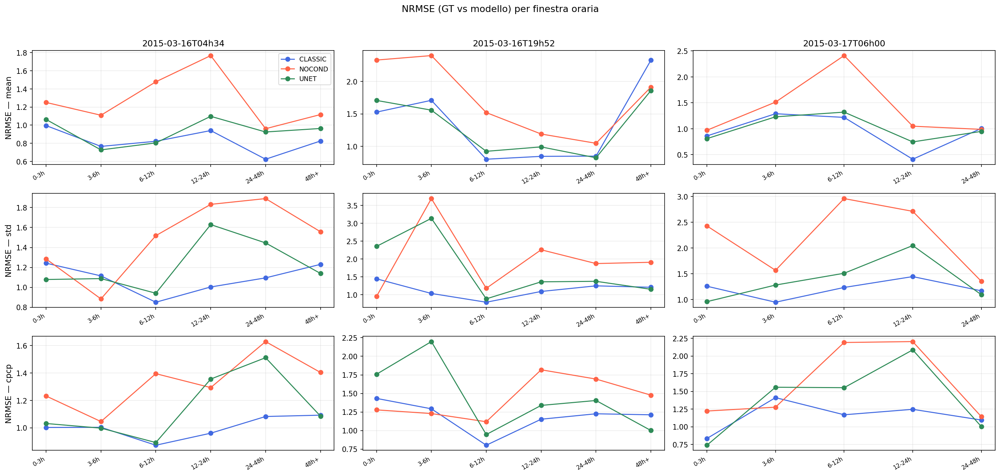

In [40]:
# =============================================================================
# NRMSE per finestra oraria — colonne = pred_tag, righe = STAT_ROWS
# =============================================================================
fig, axes = plt.subplots(len(STAT_ROWS), len(PRED_TAGS),
                          figsize=(6.5 * len(PRED_TAGS), 3 * len(STAT_ROWS)), sharex=False)

for col, tag in enumerate(PRED_TAGS):
    d_tag = comparison_by_horizon_df[comparison_by_horizon_df['pred_tag'] == tag]
    tag_labels = [h for h in HORIZON_LABELS if (d_tag['horizon'] == h).any()]
    x = np.arange(len(tag_labels))

    for row, stat in enumerate(STAT_ROWS):
        ax = axes[row, col]
        d_stat = d_tag[d_tag['stat'] == stat]
        for model_name in MODEL_ORDER:
            sub = (d_stat[d_stat['model'] == model_name]
                   .set_index('horizon').reindex(tag_labels))
            ax.plot(x, sub['nrmse'].values, color=MODEL_COLORS3[model_name],
                    marker='o', lw=1.4, label=model_name)
        ax.set_xticks(x)
        ax.set_xticklabels(tag_labels, rotation=30, ha='right', fontsize=8)
        ax.grid(alpha=0.25)
        if row == 0:
            ax.set_title(tag, fontsize=12)
        if col == 0:
            ax.set_ylabel(f'NRMSE — {stat}', fontsize=11)

axes[0, 0].legend(fontsize=9)
fig.suptitle('NRMSE (GT vs modello) per finestra oraria', fontsize=13, y=1.02)
plt.tight_layout()
show(fig, '2015_nrmse_by_horizon_grid.png')

## Media totale sul rollout — un unico bar chart, niente binning orario

Una riga di subplot (uno per metrica): asse x = i 3 `pred_tag`, mini-barre = i 4 modelli
(CLASSIC/NOCOND/UNET/PERSISTENCE), altezza = media sull'**intero** rollout valutato
(nessun raggruppamento per finestra oraria — è la sintesi "chi vince in generale").

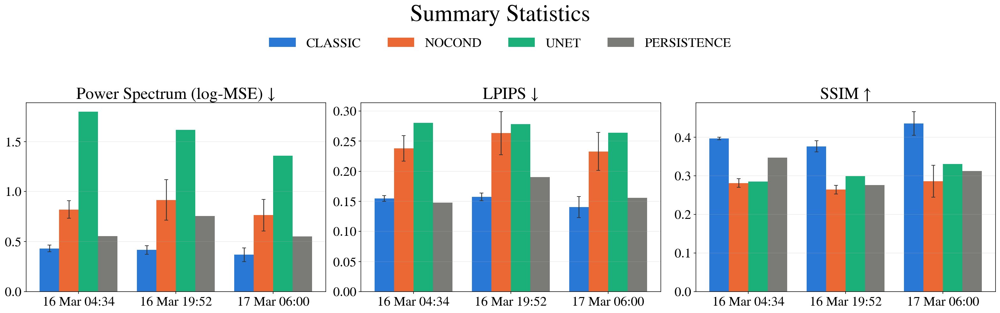

In [83]:
# =============================================================================
# Bar chart unico: x = pred_tag, mini-barre = modelli, media sull'intero rollout
# stesso stile delle celle precedenti: colori validati, legenda fuori, font, dpi=300
# error bar (+-1 std TRA I SAMPLE, non tra i frame) per CLASSIC/NOCOND (3 generazioni)
# =============================================================================
BAR_METRICS   = ['ps_log_mse', 'lpips', 'ssim']   # tutte "lower is better" tranne ssim/psnr
METRIC_DISPLAY = {'ps_log_mse': 'Power Spectrum (log-MSE) ↓', 'lpips': 'LPIPS ↓', 'ssim': 'SSIM ↑', 'psnr': 'PSNR ↑'}
MODEL_ORDER   = ['CLASSIC', 'NOCOND', 'UNET', 'PERSISTENCE']
MODEL_COLORS2 = {'CLASSIC': '#2a78d6', 'NOCOND': '#eb6834', 'UNET': '#1baf7a', 'PERSISTENCE': '#7a7a76'}

# prima media sui frame DENTRO ogni sample (un numero per pred_tag/model/sample_idx),
# poi mean+std SUI SAMPLE -- cosi' l'error bar riflette solo la variabilita' tra le 3
# generazioni diffusion, non quella (molto piu' grande) frame-a-frame lungo il rollout
per_sample_mean = df_2015_full.groupby(['pred_tag', 'model', 'sample_idx'])[BAR_METRICS].mean()
agg_all = per_sample_mean.groupby(['pred_tag', 'model']).mean()
agg_std = per_sample_mean.groupby(['pred_tag', 'model']).std().fillna(0.0)   # NaN (1 solo sample) -> 0

TAG_SHORT_LABELS = [pd.Timestamp(t.replace('T', ' ').replace('h', ':')).strftime('%d %b %H:%M')
                    for t in PRED_TAGS]

fig, axes = plt.subplots(1, len(BAR_METRICS), figsize=(7 * len(BAR_METRICS), 5.5), dpi=300)
x = np.arange(len(PRED_TAGS))
width = 0.8 / len(MODEL_ORDER)

for ax_i, (ax, metric) in enumerate(zip(axes, BAR_METRICS)):
    for i, model_name in enumerate(MODEL_ORDER):
        vals = [agg_all.loc[(tag, model_name), metric] if (tag, model_name) in agg_all.index else np.nan
                for tag in PRED_TAGS]
        # error bar solo per i modelli con piu' di 1 sample (CLASSIC/NOCOND): per UNET/PERSISTENCE
        # la std e' sempre 0 (1 solo sample), quindi niente yerr invece di disegnare un cap piatto inutile
        has_error_bar = model_name in ('CLASSIC', 'NOCOND')
        errs = ([agg_std.loc[(tag, model_name), metric] if (tag, model_name) in agg_std.index else 0.0
                 for tag in PRED_TAGS] if has_error_bar else None)
        offset = (i - (len(MODEL_ORDER) - 1) / 2) * width
        ax.bar(x + offset, vals, width, yerr=errs, capsize=3, error_kw={'linewidth': 1.2, 'ecolor': '#333333'},
               label=model_name, color=MODEL_COLORS2[model_name])
        ax.tick_params(axis='y', labelsize=20)
    ax.set_xticks(x)
    ax.set_xticklabels(TAG_SHORT_LABELS, rotation=0, ha='center', fontsize=20)
    ax.set_title(METRIC_DISPLAY.get(metric, metric), fontsize=25)
    ax.grid(alpha=0.25, axis='y')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.1),
           ncol=len(MODEL_ORDER), fontsize=20, frameon=False)
fig.suptitle('Summary Statistics', fontsize=35, y=1.18)
plt.tight_layout()
show(fig, '2015_metrics_overall_by_tag_bar.png')

## NRMSE delle timeseries scalari (cpcp/mean/std) — un unico bar chart

Stesso stile del bar chart sopra, ma usa `comparison_df` (NRMSE calcolato sull'intera traiettoria, non
sulle metriche pixel-wise LPIPS/PSNR) e solo le statistiche `cpcp`, `mean`, `std`. Niente PERSISTENCE qui:
non fa parte di `comparison_df` (calcolato solo per CLASSIC/NOCOND/UNET).

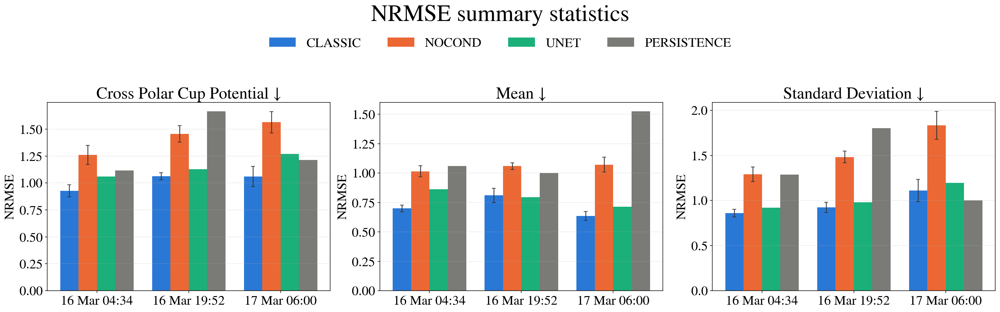

In [84]:
# =============================================================================
# Bar chart unico: x = pred_tag, mini-barre = modelli (+ PERSISTENCE), NRMSE timeseries scalari
# error bar (+-1 std tra i 3 sample) per CLASSIC/NOCOND; UNET/PERSISTENCE: 1 sample -> nessuna
# =============================================================================
NRMSE_STATS   = ['cpcp', 'mean', 'std']
NRMSE_NAMES   = {'cpcp': 'Cross Polar Cup Potential ↓', 'mean': 'Mean ↓', 'std': 'Standard Deviation ↓'}
MODEL_ORDER   = ['CLASSIC', 'NOCOND', 'UNET', 'PERSISTENCE']
MODEL_COLORS3 = {'CLASSIC': '#2a78d6', 'NOCOND': '#eb6834', 'UNET': '#1baf7a', 'PERSISTENCE': '#7a7a76'}

def per_sample_nrmse(tag, model_name, stat):
    """NRMSE calcolato separatamente per ciascun sample -> lista (len=3 diffusion, len=1 UNET)."""
    gt_by_time = ts_df[(ts_df['pred_tag'] == tag) & (ts_df['series'] == 'GT')].set_index('time')[stat]
    pred_sub = ts_df[(ts_df['pred_tag'] == tag) & (ts_df['model'] == model_name)]
    nrmses = []
    for s in sorted(pred_sub['sample_idx'].unique()):
        p_by_time = pred_sub[pred_sub['sample_idx'] == s].set_index('time')[stat]
        common = gt_by_time.index.intersection(p_by_time.index)
        if len(common) < 2:
            continue
        g = gt_by_time.loc[common].values.astype(np.float64)
        p = p_by_time.loc[common].values.astype(np.float64)
        rmse = float(np.sqrt(np.mean((g - p) ** 2)))
        nrmses.append(rmse / (g.std() + 1e-8))
    return nrmses

# --- NRMSE mean+std sui sample, per CLASSIC/NOCOND/UNET ---
nrmse_mean, nrmse_std = {}, {}
for tag in PRED_TAGS:
    for model_name in ['CLASSIC', 'NOCOND', 'UNET']:
        for stat in NRMSE_STATS:
            vals = per_sample_nrmse(tag, model_name, stat)
            nrmse_mean[(tag, model_name, stat)] = float(np.mean(vals)) if vals else np.nan
            nrmse_std[(tag, model_name, stat)]  = float(np.std(vals)) if len(vals) > 1 else 0.0

# --- NRMSE della persistenza: frame costante (ultimo di condizionamento) vs GT nel tempo ---
# nessun sample da mediare -> nessun error bar
for tag in PRED_TAGS:
    gt_by_time = ts_df[(ts_df['pred_tag'] == tag) & (ts_df['series'] == 'GT')].set_index('time')
    pred_start_tag = gt_by_time.index.min()
    persisted_stats = scalar_stats(get_gt_frame(pred_start_tag - pd.Timedelta(minutes=FRAME_DT)))

    for stat in NRMSE_STATS:
        g = gt_by_time[stat].values.astype(np.float64)
        p = np.full_like(g, persisted_stats[stat])   # valore costante ripetuto
        rmse  = float(np.sqrt(np.mean((g - p) ** 2)))
        nrmse_mean[(tag, 'PERSISTENCE', stat)] = float(rmse / (g.std() + 1e-8))
        nrmse_std[(tag, 'PERSISTENCE', stat)]  = 0.0

# etichette x compatte: "2015-03-16T04h34" -> "16 Mar 04:34" invece della stringa intera
TAG_SHORT_LABELS = [pd.Timestamp(t.replace('T', ' ').replace('h', ':')).strftime('%d %b %H:%M')
                    for t in PRED_TAGS]

fig, axes = plt.subplots(1, len(NRMSE_STATS), figsize=(7 * len(NRMSE_STATS), 5.5), dpi=300)
x = np.arange(len(PRED_TAGS))
width = 0.8 / len(MODEL_ORDER)

for ax_i, (ax, stat) in enumerate(zip(axes, NRMSE_STATS)):
    for i, model_name in enumerate(MODEL_ORDER):
        vals = [nrmse_mean.get((tag, model_name, stat), np.nan) for tag in PRED_TAGS]
        # error bar solo per CLASSIC/NOCOND (3 sample); UNET/PERSISTENCE hanno 1 solo sample -> niente yerr
        has_error_bar = model_name in ('CLASSIC', 'NOCOND')
        errs = ([nrmse_std.get((tag, model_name, stat), 0.0) for tag in PRED_TAGS] if has_error_bar else None)
        offset = (i - (len(MODEL_ORDER) - 1) / 2) * width
        ax.bar(x + offset, vals, width, yerr=errs, capsize=3, error_kw={'linewidth': 1.2, 'ecolor': '#333333'},
               label=model_name, color=MODEL_COLORS3[model_name])
        ax.tick_params(axis='y', labelsize=20)
    ax.set_ylabel('NRMSE', fontsize=20)
    ax.set_xticks(x)
    ax.set_xticklabels(TAG_SHORT_LABELS, rotation=0, ha='center', fontsize=20)
    ax.set_title(f'{NRMSE_NAMES.get(stat, stat)}', fontsize=25)
    ax.grid(alpha=0.25, axis='y')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.1),
           ncol=len(MODEL_ORDER), fontsize=20, frameon=False)
fig.suptitle('NRMSE summary statistics', fontsize=35, y=1.18)
plt.tight_layout()
show(fig, '2015_nrmse_ts_overall_by_tag_bar.png')

## Lag ottimale (in ore) — stesso stile del bar chart NRMSE

`best_lag_hours` da `comparison_df` (cross-correlazione, vedi sopra). **Niente PERSISTENCE**: è un
valore costante (std=0), quindi la cross-correlazione è indefinita — "di quanto è sfasata" una linea
piatta non è una domanda che ha risposta.

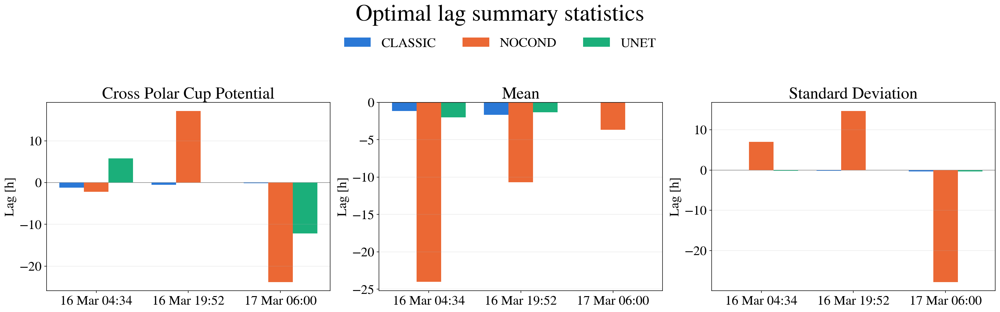

In [73]:
# =============================================================================
# Bar chart unico: x = pred_tag, mini-barre = modelli, lag ottimale [h] timeseries scalari
# =============================================================================
LAG_STATS     = ['cpcp', 'mean', 'std']
STAT_DISPLAY  = {'cpcp': 'Cross Polar Cup Potential', 'mean': 'Mean', 'std': 'Standard Deviation'}
MODEL_ORDER   = ['CLASSIC', 'NOCOND', 'UNET']   # niente PERSISTENCE: lag indefinito per un valore costante
MODEL_COLORS3 = {'CLASSIC': '#2a78d6', 'NOCOND': '#eb6834', 'UNET': '#1baf7a'}

agg_lag = comparison_df.set_index(['pred_tag', 'model', 'stat'])['best_lag_hours']

TAG_SHORT_LABELS = [pd.Timestamp(t.replace('T', ' ').replace('h', ':')).strftime('%d %b %H:%M')
                    for t in PRED_TAGS]

fig, axes = plt.subplots(1, len(LAG_STATS), figsize=(7 * len(LAG_STATS), 5.5), dpi=300)
x = np.arange(len(PRED_TAGS))
width = 0.8 / len(MODEL_ORDER)

for ax_i, (ax, stat) in enumerate(zip(axes, LAG_STATS)):
    for i, model_name in enumerate(MODEL_ORDER):
        vals = [agg_lag.get((tag, model_name, stat), np.nan) for tag in PRED_TAGS]
        offset = (i - (len(MODEL_ORDER) - 1) / 2) * width
        ax.bar(x + offset, vals, width, label=model_name, color=MODEL_COLORS3[model_name])
        ax.tick_params(axis='y', labelsize=20)
    ax.axhline(0, color='black', lw=0.8, alpha=0.5, zorder=0)
    ax.set_ylabel('Lag [h]', fontsize=20)
    ax.set_xticks(x)
    ax.set_xticklabels(TAG_SHORT_LABELS, rotation=0, ha='center', fontsize=20)
    ax.set_title(STAT_DISPLAY.get(stat, stat), fontsize=25)
    ax.grid(alpha=0.25, axis='y')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.1),
           ncol=len(MODEL_ORDER), fontsize=20, frameon=False)
fig.suptitle('Optimal lag summary statistics', fontsize=35, y=1.18)
plt.tight_layout()
show(fig, '2015_lag_ts_overall_by_tag_bar.png')